<a href="https://colab.research.google.com/github/hamant-jagwan/Bike_Sharing_Demand_Prediction--ML--Regression/blob/main/Bike_Sharing_Demand_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Bike Sharing Demand Prediction**


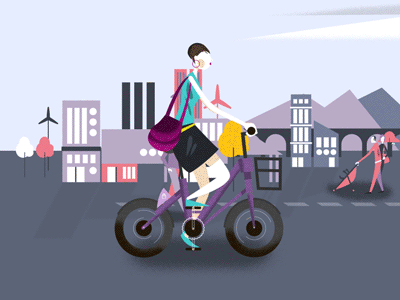

## **Problem Statement**

Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.

## **Data Description**
The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.
## **Attribute Information:**
1. Date : year-month-day
2. **Rented Bike count - Count of bikes rented at each hour(dependent value)**
3. Hour - Hour of the day
4. Temperature-Temperature in Celsius
5. Humidity - %
6. Windspeed - m/s
7. Visibility - 10m
8. Dew point temperature - Celsius
9. Solar radiation - MJ/m2
10. Rainfall - mm
11. Snowfall - cm
12. Seasons - Winter, Spring, Summer, Autumn
13. Holiday - Holiday/No holiday
14. Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)


In [ ]:
# Importing required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from scipy.stats import norm
from tabulate import tabulate
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb

from sklearn import metrics
from sklearn import tree
from IPython.display import SVG
from graphviz import Source
from IPython.display import display

#for visualizing decision trees
import graphviz
from sklearn.tree import export_graphviz
sns.set_style('darkgrid')

#suppress all warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Load Dataset
data = 'https://raw.githubusercontent.com/hamant-jagwan/Bike_Sharing_Demand_Prediction--ML-regression/main/Bike_Sharing_demand_prediction.csv'
bike_df = pd.read_csv(data, encoding= 'ISO-8859-1')

In [ ]:
# First 10 observation
bike_df.head(10)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes
5,01/12/2017,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes
6,01/12/2017,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes
7,01/12/2017,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes
8,01/12/2017,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes
9,01/12/2017,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
# Last 10 observations
bike_df.tail(10)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8750,30/11/2018,761,14,7.8,20,2.2,2000,-13.8,1.67,0.0,0.0,Autumn,No Holiday,Yes
8751,30/11/2018,768,15,7.0,20,3.3,1994,-14.4,1.21,0.0,0.0,Autumn,No Holiday,Yes
8752,30/11/2018,837,16,7.2,23,1.5,1945,-12.6,0.72,0.0,0.0,Autumn,No Holiday,Yes
8753,30/11/2018,1047,17,6.0,29,2.1,1877,-10.7,0.23,0.0,0.0,Autumn,No Holiday,Yes
8754,30/11/2018,1384,18,4.7,34,1.9,1661,-9.8,0.00,0.0,0.0,Autumn,No Holiday,Yes
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.00,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.00,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.00,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.00,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.00,0.0,0.0,Autumn,No Holiday,Yes


## **Data Inspection**

In [ ]:
# Checking shape of the dataset
bike_df.shape

(8760, 14)

In [ ]:
# Checking columns name of dataset
bike_df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [ ]:
# Basic information of dataset
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [ ]:
# Description of Dataset
bike_df.describe(include = 'all')

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2
top,01/12/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spring,No Holiday,Yes
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,NaN,NaN,NaN


## **Handling Duplicate Values**


In [ ]:
# Checking for number of duplicated values
count_duplicated = bike_df.duplicated().sum()
print(f'Dataset having {count_duplicated} duplicated values')

Dataset having 0 duplicated values


## **Handling Null/ Missing Values**

In [ ]:
# Checking for number of null values
count_null=pd.DataFrame(bike_df.isna().sum()).rename(columns={0:'number_of_nulls_values'})
count_null

,number_of_nulls_values
Date,0
Rented Bike Count,0
Hour,0
Temperature(°C),0
Humidity(%),0
Wind speed (m/s),0
Visibility (10m),0
Dew point temperature(°C),0
Solar Radiation (MJ/m2),0
Rainfall(mm),0


Dataset having 0 null values.

## **Handling Outliers**

### **Categorical variables**

In [ ]:
# Find categorical variables
bike_df['Date'] = bike_df['Date'].astype('datetime64[ns]') # Changing the data type of 'Date' columns

categorical_variables = [var for var in bike_df.columns if bike_df[var].dtype=='O']  # extracts the names of columns in bike_df that contain categorical variables
print('There are {} categorical variables'.format(len(categorical_variables)))
print('--'*50)
print(categorical_variables)

There are 3 categorical variables
----------------------------------------------------------------------------------------------------
['Seasons', 'Holiday', 'Functioning Day']


In [ ]:
# Checking number of categories in each categorical variables
categorical_variables_df = bike_df[categorical_variables]
for i in categorical_variables_df.columns:
    print(categorical_variables_df[i].value_counts())
    print('--'*50)

Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: Seasons, dtype: int64
----------------------------------------------------------------------------------------------------
No Holiday    8328
Holiday        432
Name: Holiday, dtype: int64
----------------------------------------------------------------------------------------------------
Yes    8465
No      295
Name: Functioning Day, dtype: int64
----------------------------------------------------------------------------------------------------


There are three categorical variables: "Seasons," "Holidays," and "Functioning Day."

### **Numerical variables**

In [ ]:
# Finding numerical variables
numerical_variables=[var for var in bike_df.columns if var not in categorical_variables]
print('There are {} numerical variables'.format(len(numerical_variables)))
print('--'*50)
print(numerical_variables)

There are 11 numerical variables
----------------------------------------------------------------------------------------------------
['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']


In [ ]:
# Checking number of categories
numerical_variables_df= bike_df[numerical_variables]
for i in numerical_variables_df.columns:
    print(numerical_variables_df[i].value_counts())
    print('--'*50)

2017-01-12    24
2018-09-08    24
2018-07-08    24
2018-06-08    24
2018-05-08    24
              ..
2018-03-31    24
2018-03-30    24
2018-03-29    24
2018-03-28    24
2018-11-30    24
Name: Date, Length: 365, dtype: int64
----------------------------------------------------------------------------------------------------
0       295
122      19
223      19
262      19
165      18
       ... 
2096      1
2440      1
1600      1
3384      1
595       1
Name: Rented Bike Count, Length: 2166, dtype: int64
----------------------------------------------------------------------------------------------------
0     365
1     365
22    365
21    365
20    365
19    365
18    365
17    365
16    365
15    365
14    365
13    365
12    365
11    365
10    365
9     365
8     365
7     365
6     365
5     365
4     365
3     365
2     365
23    365
Name: Hour, dtype: int64
----------------------------------------------------------------------------------------------------
 19.1    40
 20.5    40

Date, Rented Bike Count, Hour, Temperature (°C),Humidity (%), Wind speed (m/s), Visibility (10 m), Dew point temperature (°C), Solar Radiation (MJ/m2),Rainfall (mm) and Snowfall (cm) are total 11 numerical variables.

____________________________________________________________________________________________________


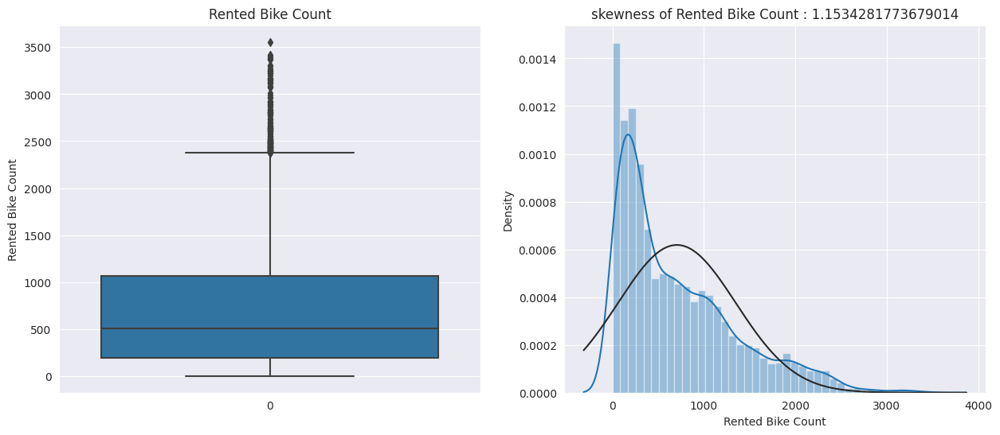

____________________________________________________________________________________________________


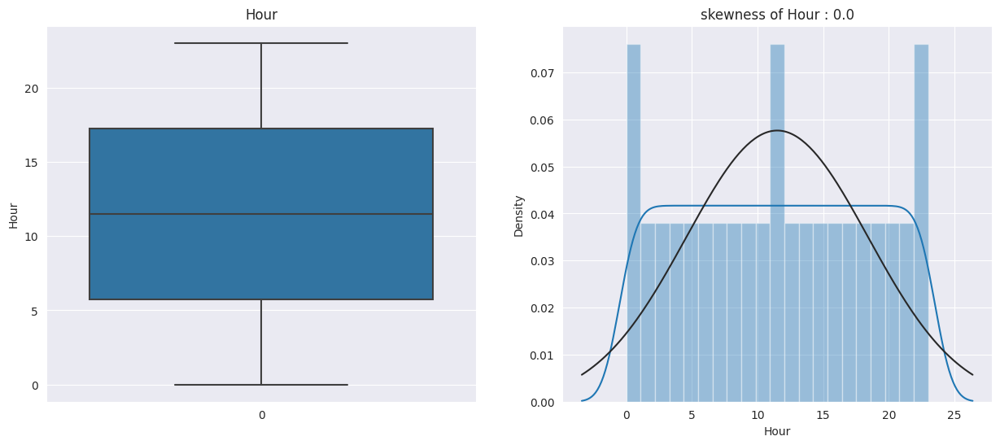

____________________________________________________________________________________________________


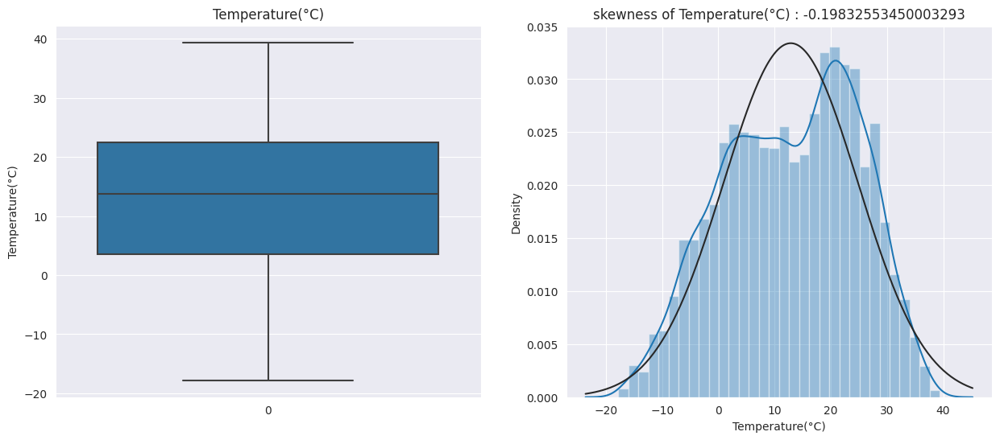

____________________________________________________________________________________________________


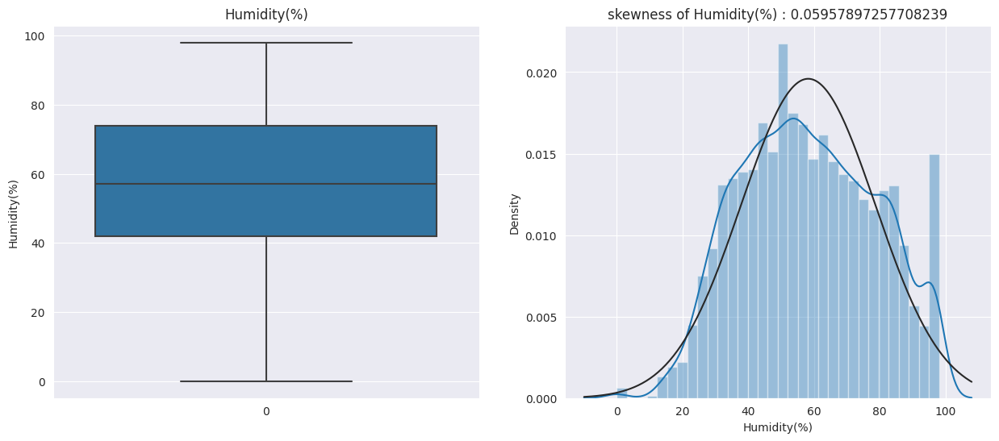

____________________________________________________________________________________________________


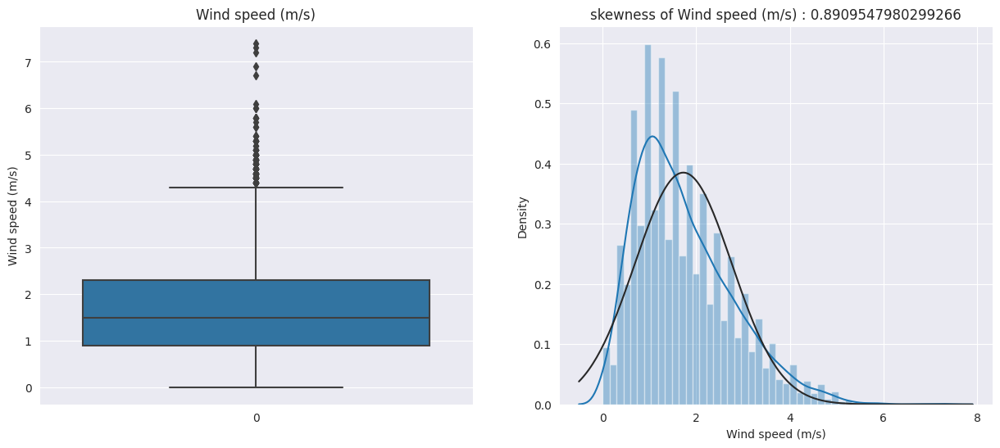

____________________________________________________________________________________________________


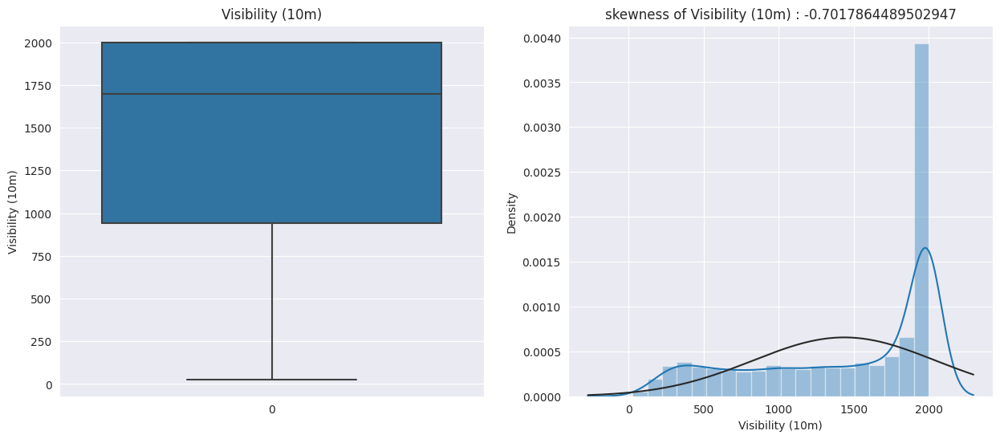

____________________________________________________________________________________________________


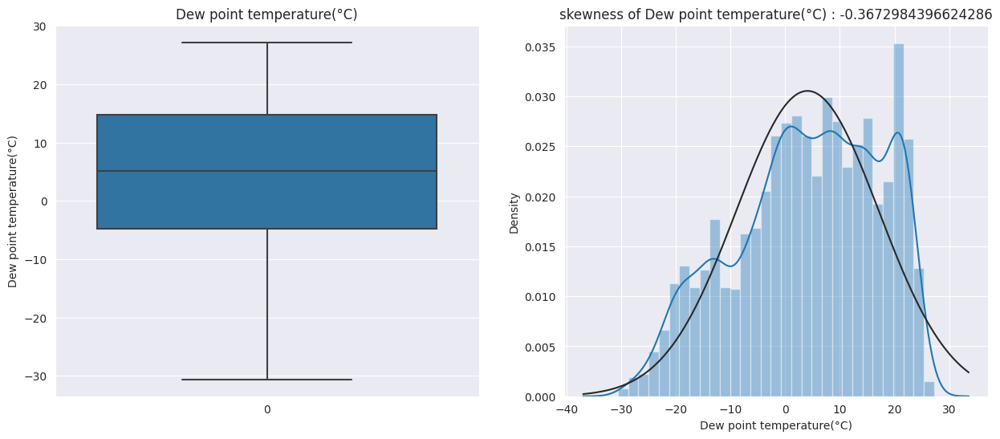

____________________________________________________________________________________________________


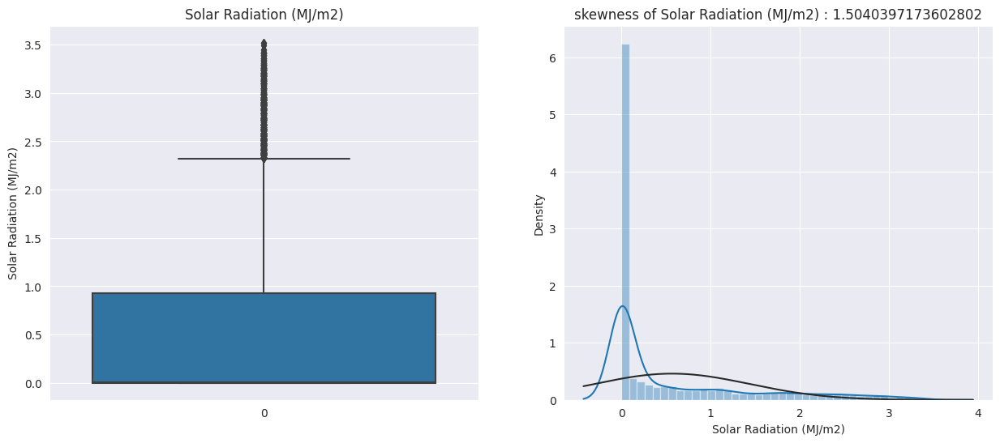

____________________________________________________________________________________________________


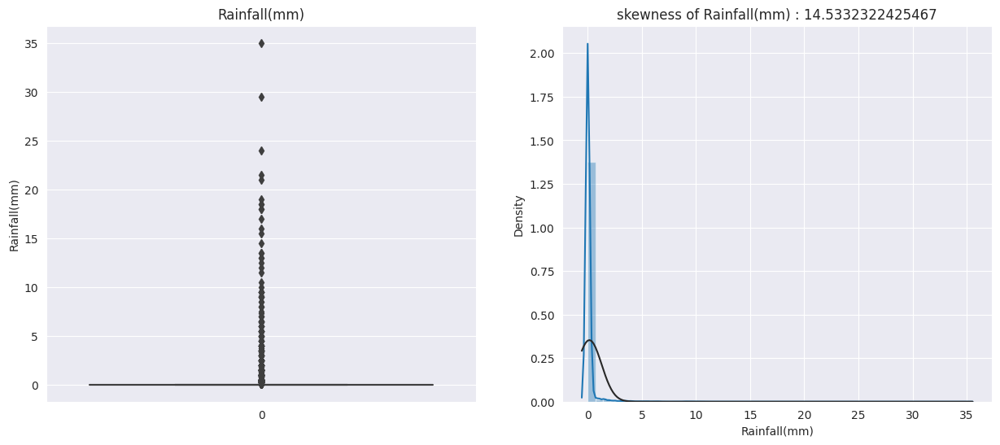

____________________________________________________________________________________________________


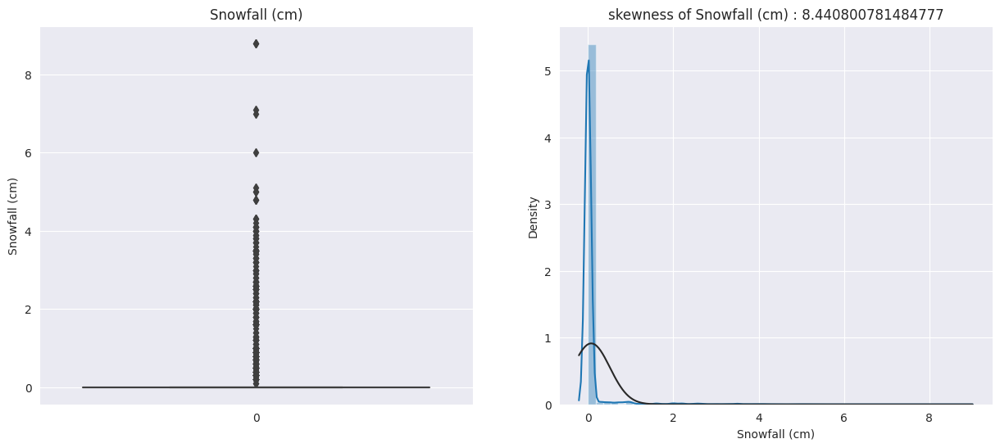

In [ ]:
# Checking for outliers in numerical variables using boxplot
from scipy.stats import norm

# Removing "Date" variable from numerical variable
num_var=[var for var in numerical_variables_df.columns if var not in ["Date"]]

# Plotting Box and Distribution plot
for var in num_var:
    plt.figure(figsize=(15,6))
    plt.subplot(1,2,1)
    ax=sns.boxplot(data=bike_df[var]) # This creates a boxplot using the data from the bike_df DataFrame for the current variable var.
    ax.set_title(f'{var}')
    ax.set_ylabel(var)

    plt.subplot(1,2,2)
    ax=sns.distplot(bike_df[var], fit=norm)
    # This creates a distribution plot using the data from the bike_df DataFrame for the current variable var.
    #The fit=norm parameter fits a normal distribution to the data.
    ax.set_title(f'skewness of {var} : {bike_df[var].skew()}')
    ax.set_xlabel(var)
    print('__'*50)
    plt.show()

The variables Rented Bike Count, Wind speed (m/s), Solar Radiation (MJ/m2), Rainfall (mm) and Snowfall (cm) have outliers. Rainfall (mm) and Snowfall (cm) have a flat interquartile range; it is best to remove those columns.

In [ ]:
# Using Inter Quartile Range for removing outliers from numerical variables

# Defining outlier features
outlier_var=['Rented Bike Count', 'Wind speed (m/s)', 'Solar Radiation (MJ/m2)']

# Capping dataset
for i in outlier_var:
    # Findling IQR
    Q1= bike_df[i].quantile(0.25)
    Q3= bike_df[i].quantile(0.75)
    IQR=Q3-Q1

    # Defining upper and lower limit
    lower_limit = bike_df[i].quantile(0.25)-1.5*IQR
    upper_limit = bike_df[i].quantile(0.75)+1.5*IQR

    # Applying lower and upper limit to each variables
    bike_df.loc[(bike_df[i] > upper_limit),i] = upper_limit # it replaces values above the upper limit with the upper limit itself.
    bike_df.loc[(bike_df[i] < lower_limit),i] = lower_limit #It replaces values below the lower limit with the lower limit itself.

____________________________________________________________________________________________________


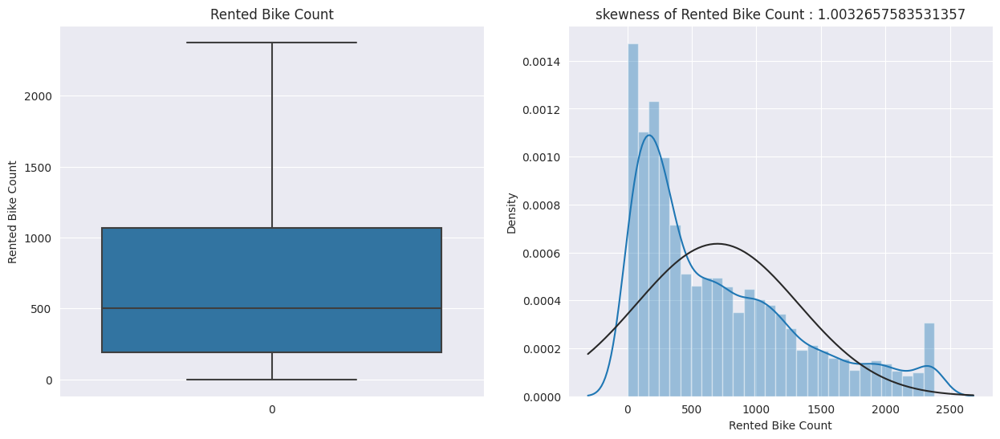

____________________________________________________________________________________________________


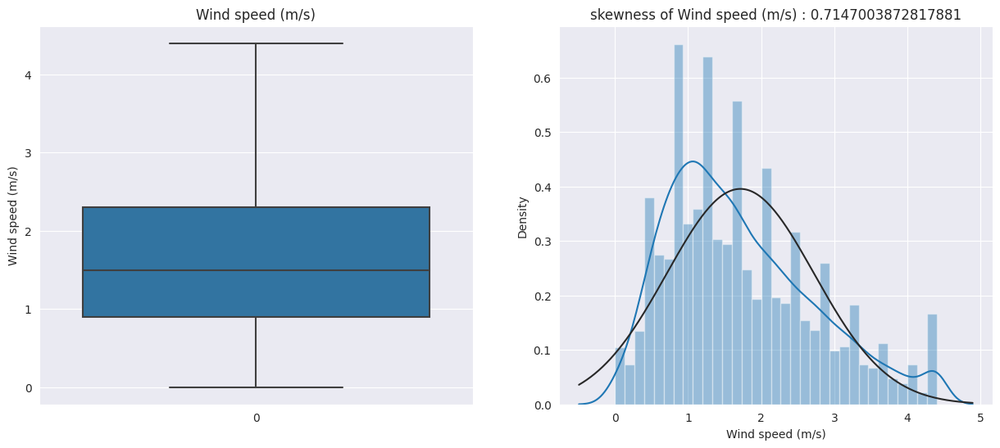

____________________________________________________________________________________________________


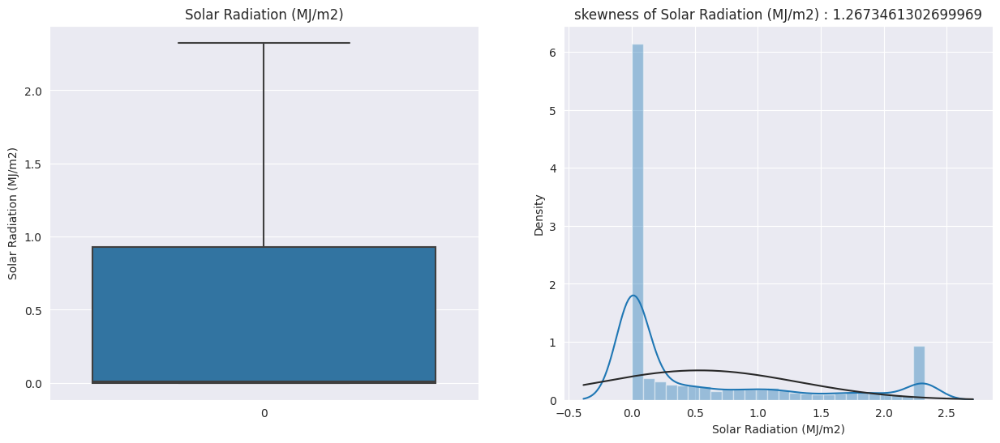

In [ ]:
# Checking outliers for after removing it

for var in outlier_var:
    plt.figure(figsize=(15,6))
    plt.subplot(1,2,1)
    ax=sns.boxplot(data=bike_df[var])
    ax.set_title(f'{var}')
    ax.set_ylabel(var)

    plt.subplot(1,2,2)
    ax=sns.distplot(bike_df[var], fit=norm)
    ax.set_title(f'skewness of {var} : {bike_df[var].skew()}')
    ax.set_xlabel(var)
    print('__'*50)
    plt.show()

Outliers are successfully handled from datasets.

In [ ]:
# Final Basic description of dataset
bike_df.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,698.789812,11.500000,12.882922,58.226256,1.715993,1436.825799,4.073813,0.536235,0.148687,0.075068
std,626.910124,6.922582,11.944825,20.362413,1.008186,608.298712,13.060369,0.785364,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,2376.625000,23.000000,39.400000,98.000000,4.400000,2000.000000,27.200000,2.325000,35.000000,8.800000


## **Data Wrangling and Feature Engineering**

In [ ]:
# Dataset
bike_df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,2017-01-12,254.0,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-01-12,204.0,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2017-01-12,173.0,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,2017-01-12,107.0,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,2017-01-12,78.0,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
# Checking unique values from each variable
for i in bike_df.columns:
    print(f'{i} : {bike_df[i].unique()}')
    print('--'*50)

Date : ['2017-01-12T00:00:00.000000000' '2017-02-12T00:00:00.000000000'
 '2017-03-12T00:00:00.000000000' '2017-04-12T00:00:00.000000000'
 '2017-05-12T00:00:00.000000000' '2017-06-12T00:00:00.000000000'
 '2017-07-12T00:00:00.000000000' '2017-08-12T00:00:00.000000000'
 '2017-09-12T00:00:00.000000000' '2017-10-12T00:00:00.000000000'
 '2017-11-12T00:00:00.000000000' '2017-12-12T00:00:00.000000000'
 '2017-12-13T00:00:00.000000000' '2017-12-14T00:00:00.000000000'
 '2017-12-15T00:00:00.000000000' '2017-12-16T00:00:00.000000000'
 '2017-12-17T00:00:00.000000000' '2017-12-18T00:00:00.000000000'
 '2017-12-19T00:00:00.000000000' '2017-12-20T00:00:00.000000000'
 '2017-12-21T00:00:00.000000000' '2017-12-22T00:00:00.000000000'
 '2017-12-23T00:00:00.000000000' '2017-12-24T00:00:00.000000000'
 '2017-12-25T00:00:00.000000000' '2017-12-26T00:00:00.000000000'
 '2017-12-27T00:00:00.000000000' '2017-12-28T00:00:00.000000000'
 '2017-12-29T00:00:00.000000000' '2017-12-30T00:00:00.000000000'
 '2017-12-31T00:00

In [ ]:
# Performing feature engineering on feature Date
# Values extracted from the datetime column.
bike_df['day'] = bike_df['Date'].dt.day
bike_df['month'] = bike_df['Date'].dt.month
bike_df['year'] = bike_df['Date'].dt.year

In [ ]:
# Dropping original  Date feature after performing feature engineering
bike_df.drop(columns='Date', axis=1, inplace=True)

In [ ]:
# Basic information of dataset
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   float64
 1   Hour                       8760 non-null   int64  
 2   Temperature(°C)            8760 non-null   float64
 3   Humidity(%)                8760 non-null   int64  
 4   Wind speed (m/s)           8760 non-null   float64
 5   Visibility (10m)           8760 non-null   int64  
 6   Dew point temperature(°C)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)    8760 non-null   float64
 8   Rainfall(mm)               8760 non-null   float64
 9   Snowfall (cm)              8760 non-null   float64
 10  Seasons                    8760 non-null   object 
 11  Holiday                    8760 non-null   object 
 12  Functioning Day            8760 non-null   object 
 13  day                        8760 non-null   int64

In [ ]:
# Checking dataset
bike_df.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,day,month,year
0,254.0,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1,2017
1,204.0,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1,2017
2,173.0,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1,2017
3,107.0,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1,2017
4,78.0,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1,2017


The variables day, month, and year were created from the variable Date, and the original variables were deleted.

## **Exploratory data analysis**





### **Univariate Analysis**

In [ ]:
# Obtaing target variable
excluded_variables=[var for var in bike_df.columns if len(bike_df[var].value_counts()) > 15]
target_variables=[var for var in bike_df.columns if var not in excluded_variables]

# Defining r to autofit the number and size of plots
r = int(len(target_variables)/3 +1)

In [ ]:
# Defining a function to Notate the percent count of each value on the bars
def annot_percent(axes):
    '''Takes axes as input and labels the percent count of each bar in a countplot'''
    for p in axes.patches:
        total = sum(p.get_height() for p in axes.patches) / 100
        percent = round((p.get_height() / total), 2)
        x = p.get_x() + p.get_width() / 2
        y = p.get_height()
        axes.annotate(f'{percent}%', (x, y), ha='center', va='bottom')


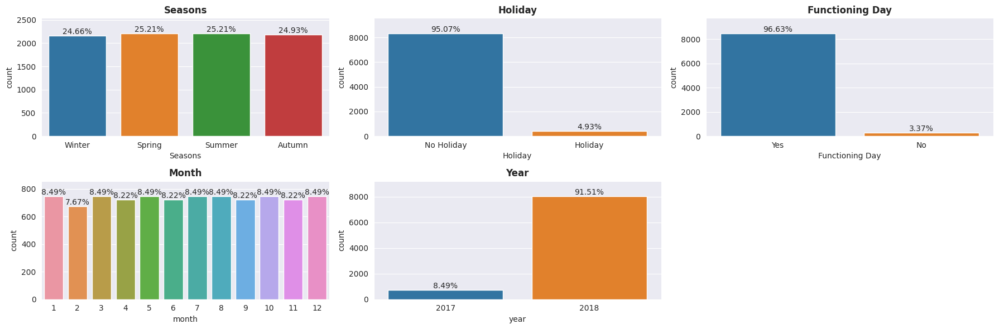

In [ ]:
# Plotting the countplots for each variable in target_variables
plt.figure(figsize=(18,r*3))
for n,var in enumerate(target_variables):
    plot = plt.subplot(r,3,n+1)
    sns.countplot(x=bike_df[var]).margins(y=0.15)
    plt.title(f'{var.title()}',weight='bold')
    plt.tight_layout()
    annot_percent(plot)

Observations :

1. Customers favour rental motorcycles equally in all seasons.
2. When there are no holidays, customers choose to rent motorcycles. Customers 3. hardly ever use the bikes they rent while traveling on holiday.
4. Nearly all consumers preferred to rent bikes during functional hours.
5. Bicycle rentals are popular all month long.
6. Renting bicycles was not very popular in 2017, but it increased by 83.02 percent in 2018.

### **Bivariate Analysis**

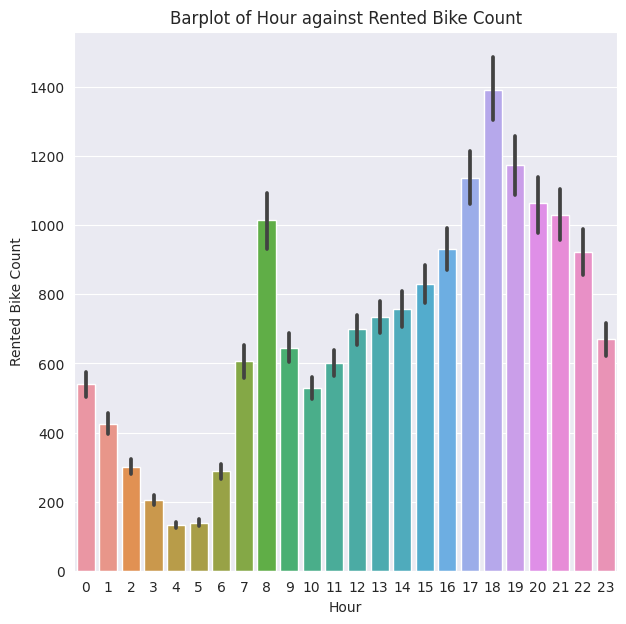

In [ ]:
# Plotting graph of 'Hour' against 'Rented Bike Count'
plt.figure(figsize=(7,7))
ax=sns.barplot(x="Hour", y="Rented Bike Count",data= bike_df)
ax.set_title('Barplot of Hour against Rented Bike Count')
plt.show()

Observations :

1. At night, customers do not prefer to use rented bikes.
2.Customers do not prefer rented bikes in the mornings 4 and 5, but from 7, 8, and 9, the use of rented bikes increases, possibly due to working people going to the office, and it is the same in the evenings 5, 6, and 7, because people are travelling from the office to home. Overall, the rented bike was the most frequently used during office in and out times.
3. Customers mostly use rented bikes for transportation in the evening.

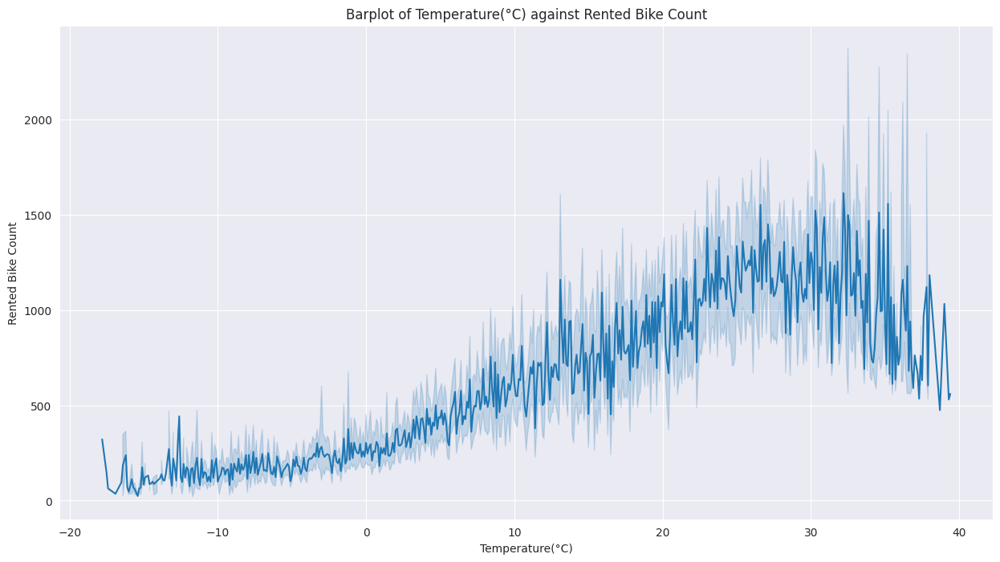

In [ ]:
# Checking effect of temperature(°C) on rented bike use
plt.figure(figsize=(15,8))
ax=sns.lineplot(x="Temperature(°C)", y="Rented Bike Count",data=bike_df)
ax.set_title('Barplot of Temperature(°C) against Rented Bike Count')
plt.show()

Observations :

Most customers use a rented bike when the temperature is normal, but when the temperature is below normal, people do not use a rented bike.

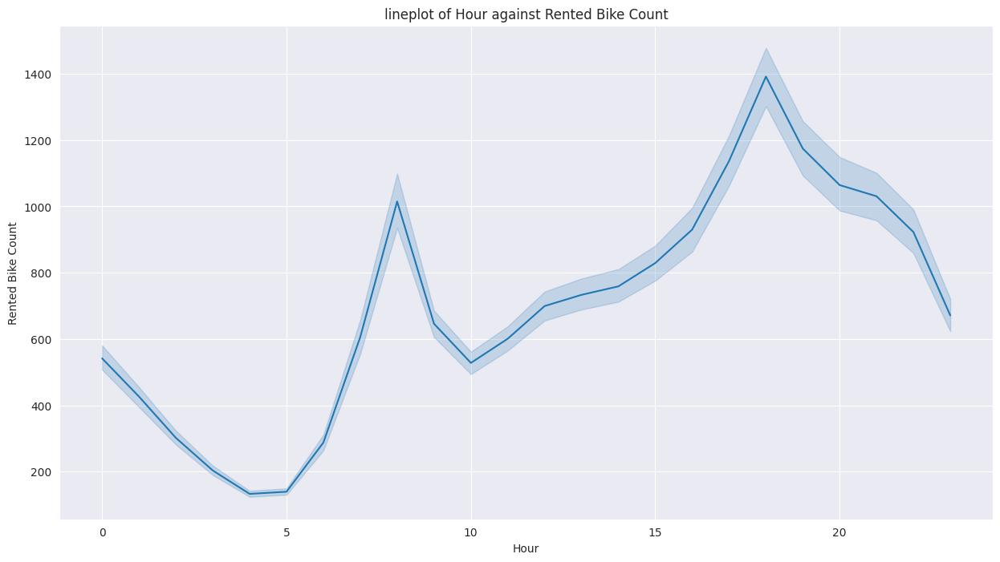

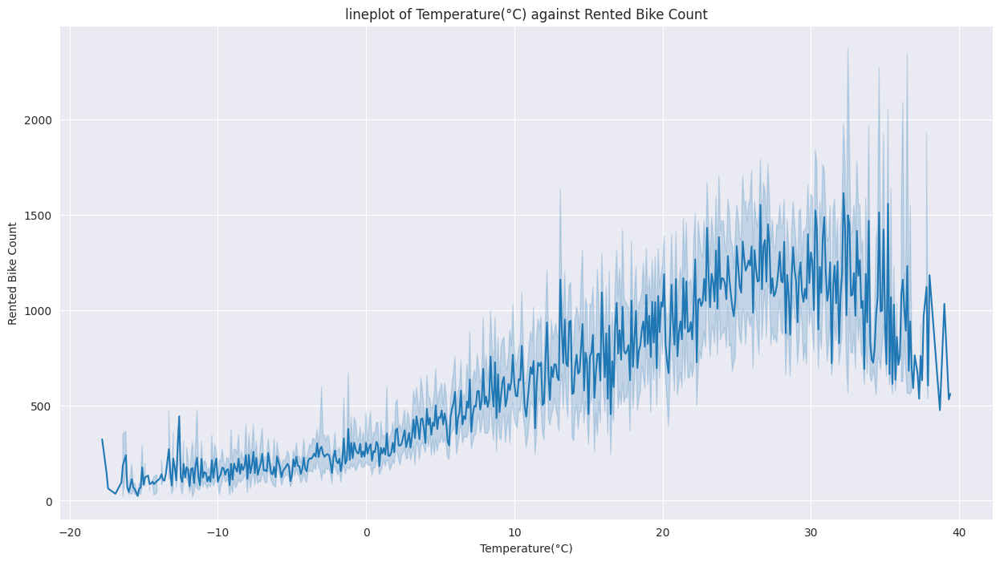

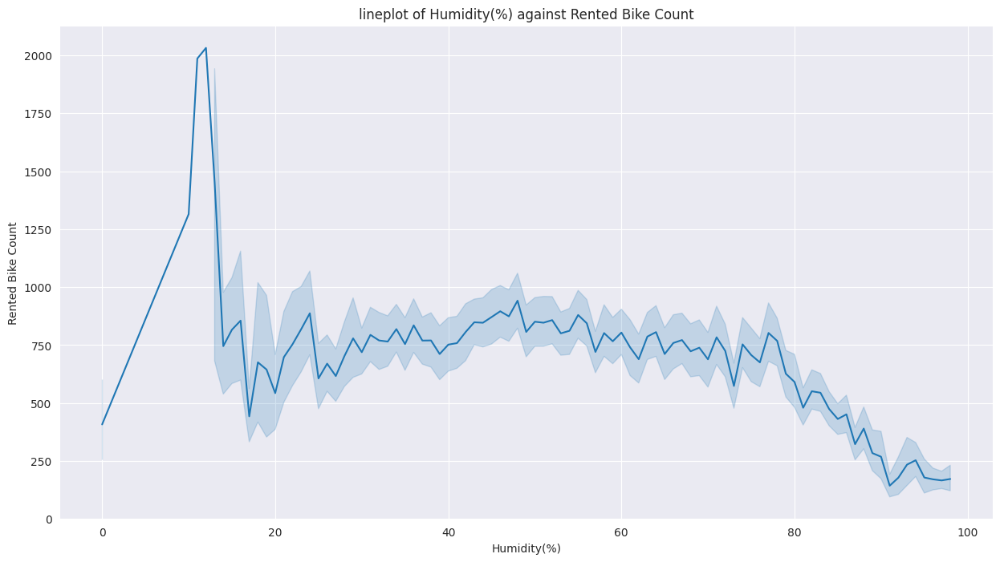

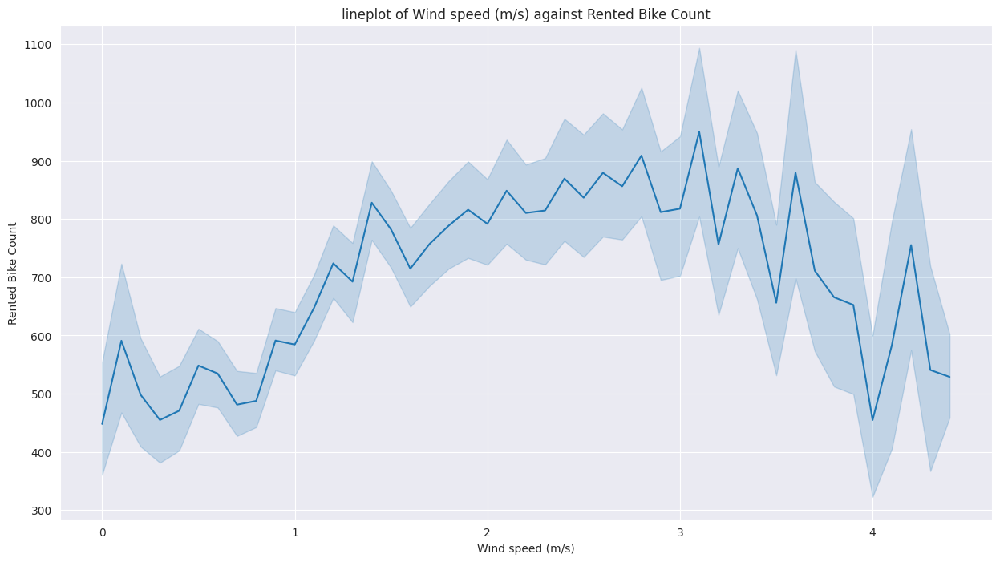

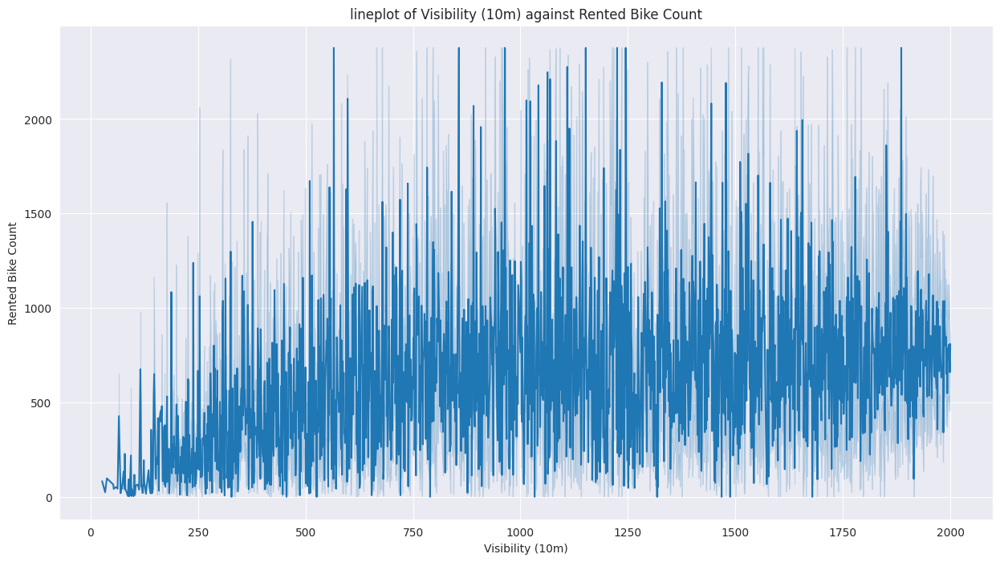

...

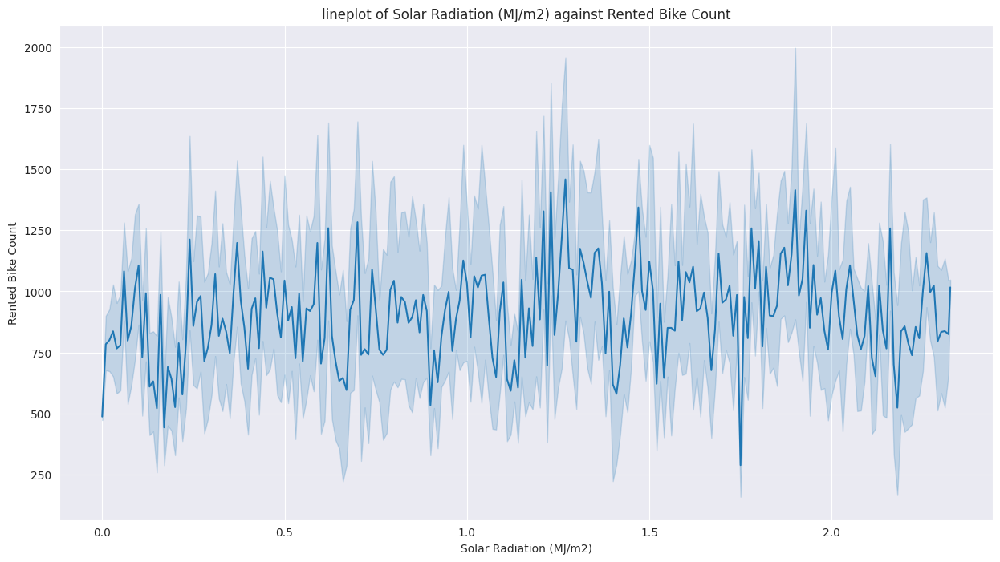

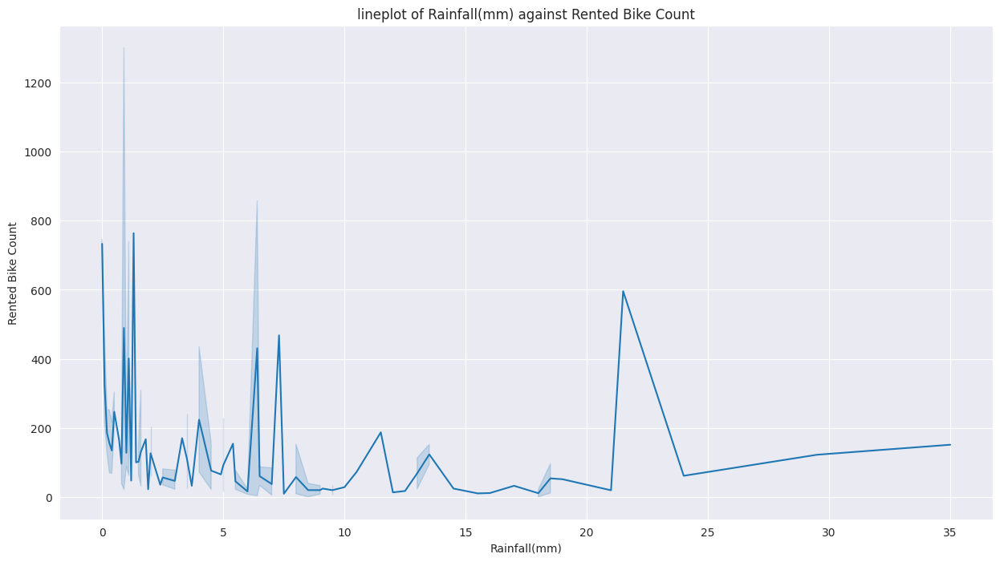

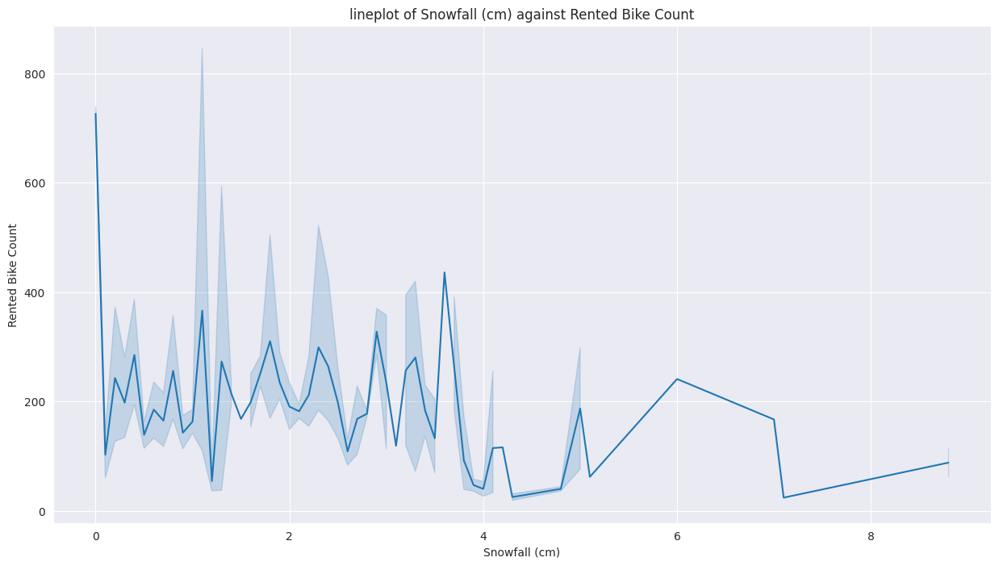

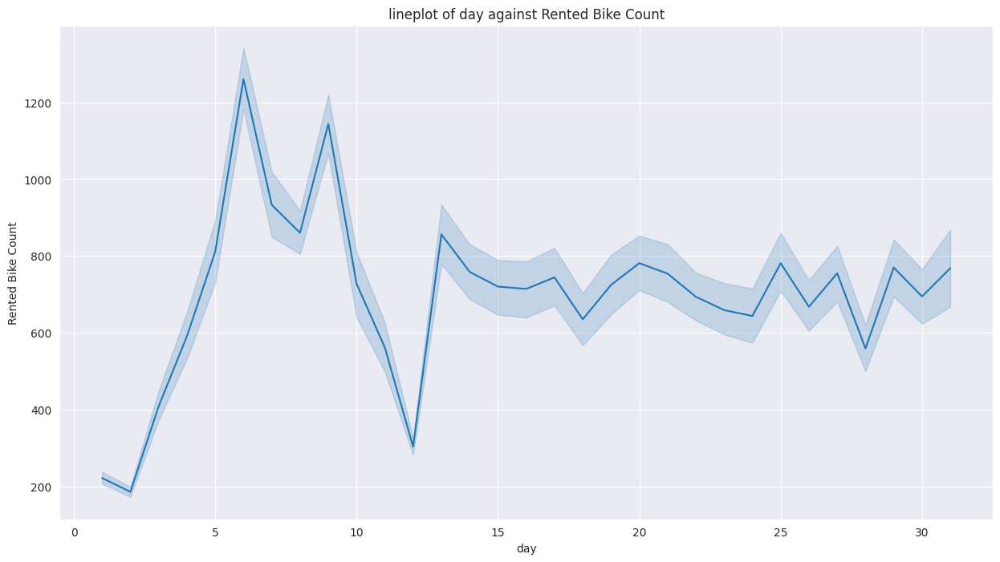

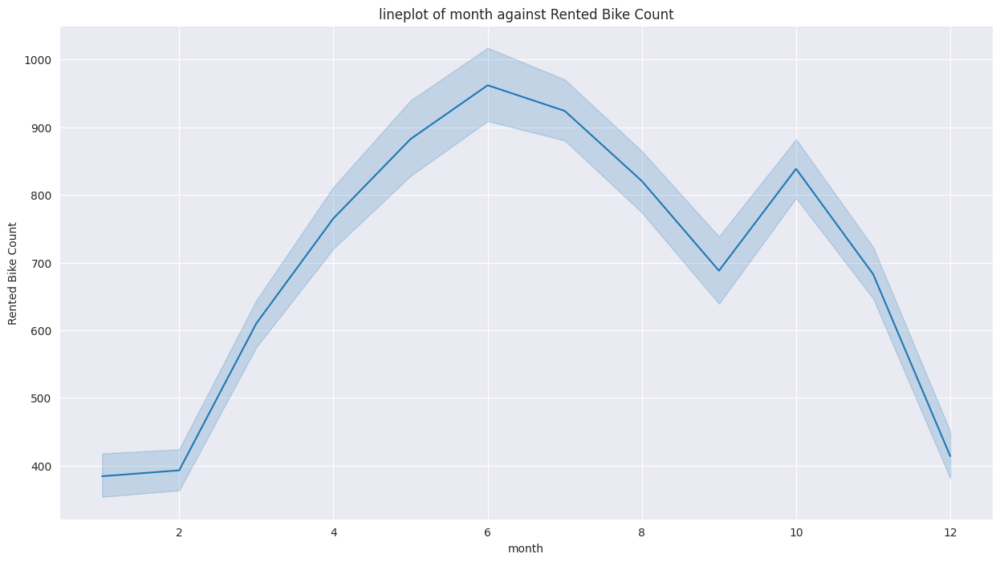

In [ ]:
# Checking effect of each variable on use of rented bike
target_variables=[var for var in bike_df.columns if var not in ['Rented Bike Count', 'Seasons', 'Holiday', 'Functioning Day', 'year']]
for var in target_variables:
    plt.figure(figsize=(15,8))
    ax=sns.lineplot(x=bike_df[var], y=bike_df["Rented Bike Count"],data=bike_df)
    ax.set_title(f'lineplot of {var} against Rented Bike Count')
    plt.show()

Obsevations :

1. Customers who travel most commonly use rented bikes in the morning at 8 a.m. and in the evening at 6 p.m.
2. When the humidity level is between 10% and 18%, people prefer to rent bikes.
3. When wind speed is between 2 m/s and 3.5 m/s, people consistently use rented bikes, and it is at its peak when wind speed is normal, which is 3.2 m/s.
4. Renting a bike is the best option for customers in dew point temperatures ranging from 12°C to 18°C. The use of a rented bike increases with increasing dew point temperatures, but it still reaches normal dew point temperatures.
5. According to the graph, solar radiation has no effect on customer use of rented bikes.
6. When it's not raining, people prefer rental bikes the most.
7. When there is no snowfall, most people opt to rent bikes. However, the majority of customers prefer to rent bikes when it snows up to 4 cm.
8. In the first 10 days of the month, most rented bikes are used by customers. Customers consistently use rented bikes in the last 15 days of the month.
9. In June, most rented bikes are used through the year, followed by October. Customers' use of rent bikes is at its peak from April to September.

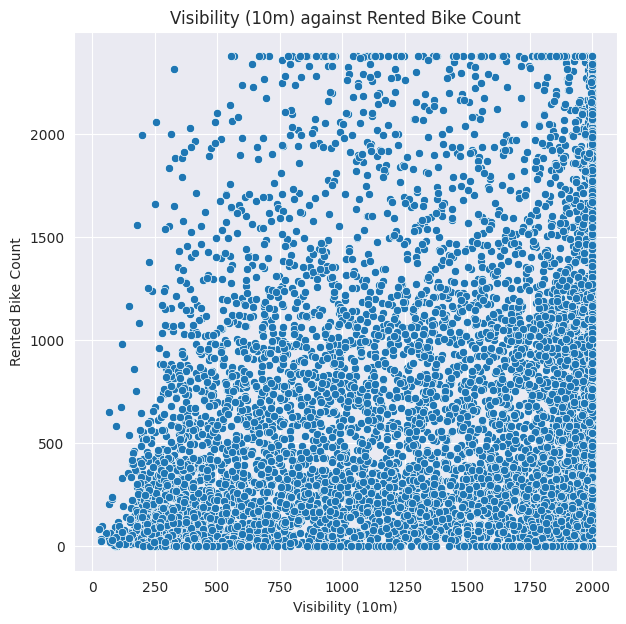

In [ ]:
# Plotting graph of 'Visibility (10m)' against 'Rented Bike Count'
plt.figure(figsize=(7,7))
ax=sns.scatterplot(x="Visibility (10m)", y="Rented Bike Count",data=bike_df)
ax.set_title('Visibility (10m) against Rented Bike Count')
plt.show()

Observation :

The count of rented bikes on that day is unaffected by the day's visibility, but when visibility exceeds 1750, use of rented bikes increases more than usual.

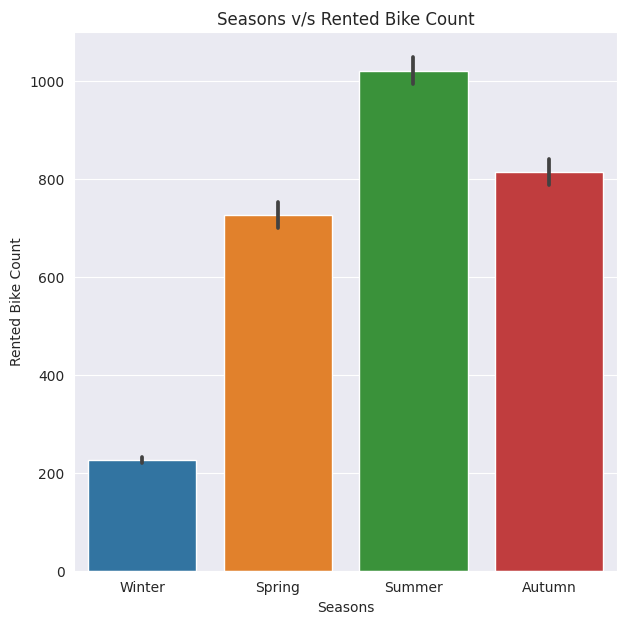

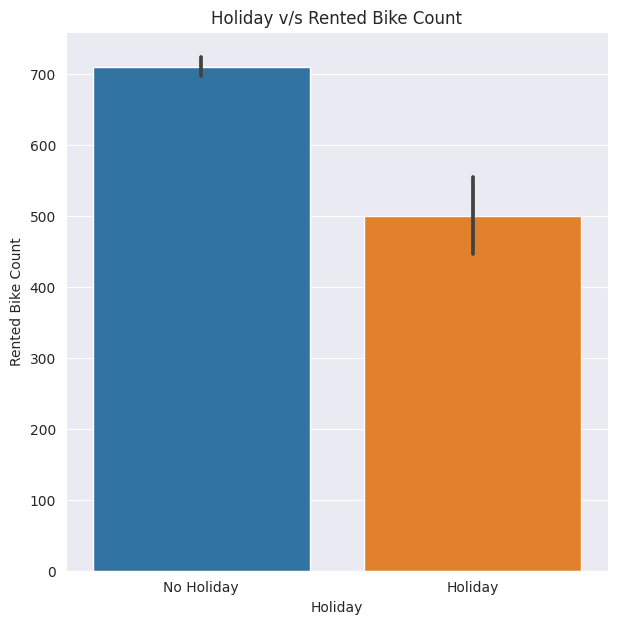

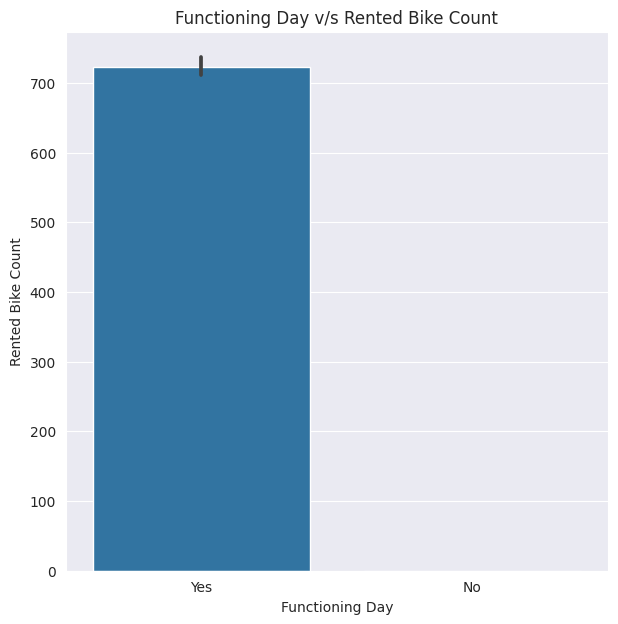

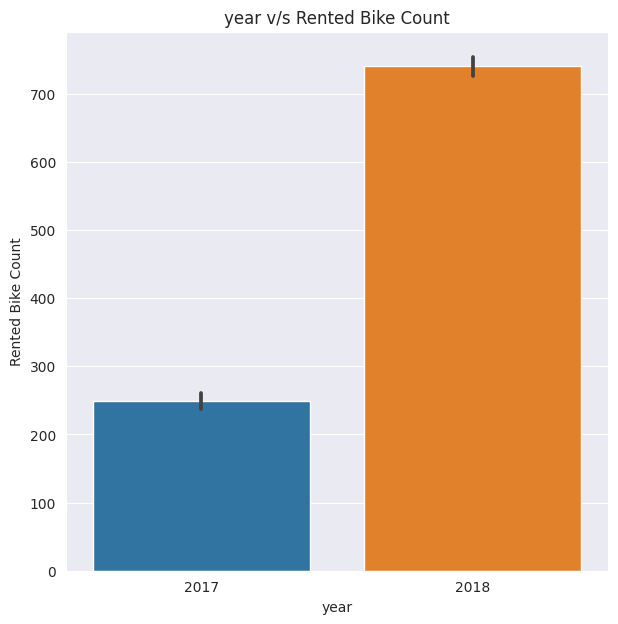

In [ ]:
# Plotting bar plot for variables

# Defining target variables
target=[]

for var in bike_df.columns :
  if var in ['Seasons', 'Holiday', 'Functioning Day', 'year']:
    target.append(var)

for var in target:
    plt.figure(figsize=(7,7))
    ax=sns.barplot(x=bike_df[var], y='Rented Bike Count', data=bike_df)
    ax.set_title(f'{var} v/s Rented Bike Count')
    plt.show()

Observations :

1. During the summer and autumn seasons, most people rent bikes. During the winter, fewer people choose to rent bikes.
2. Even when there is no holiday other than a holiday, people rent bikes. The use of rented bikes on holidays is lower than on non-holiday days.
3. Almost every rented bike is used during its functional hours.
4. The use of rented bikes increased by three times in 2018 compared to 2017.

## **Data Pre - processing**

### **Transforming into normal distribution**

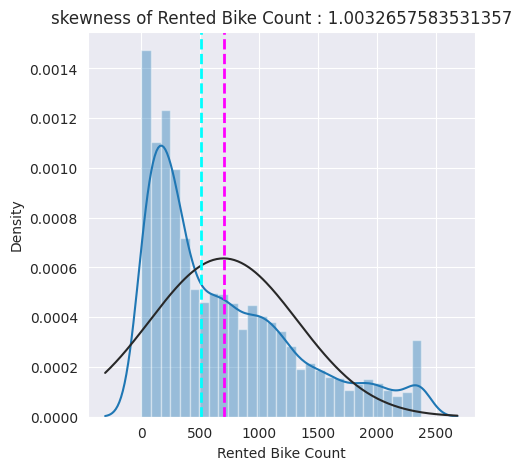

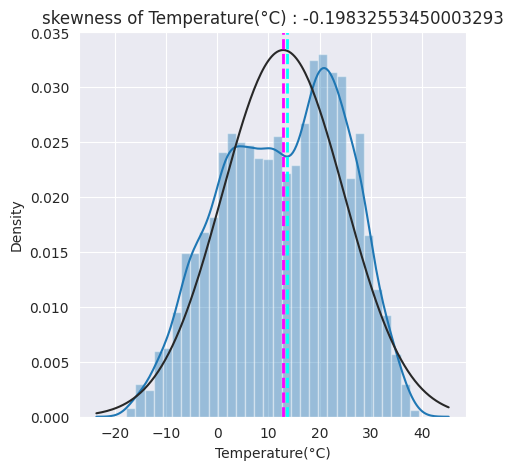

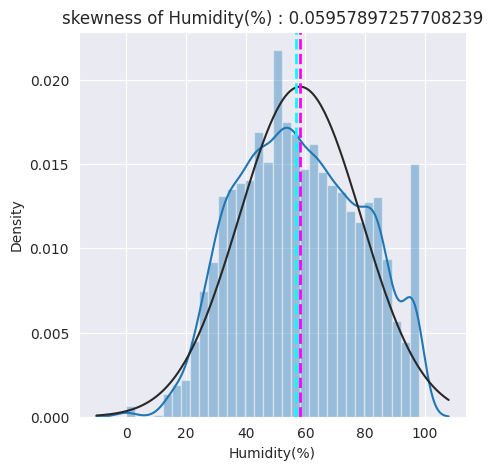

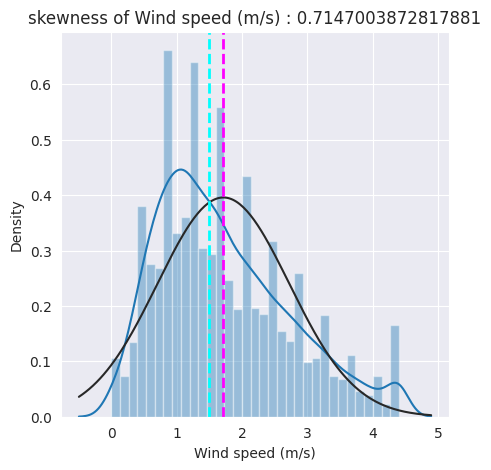

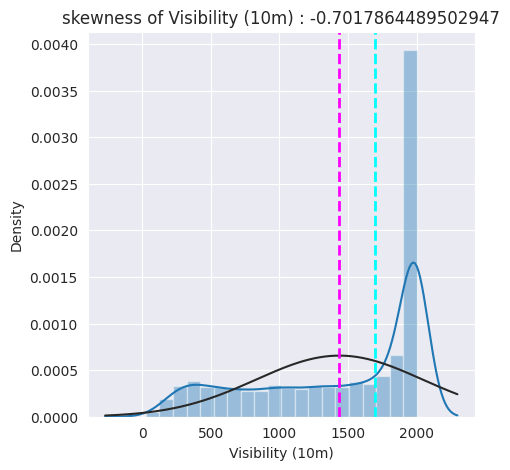

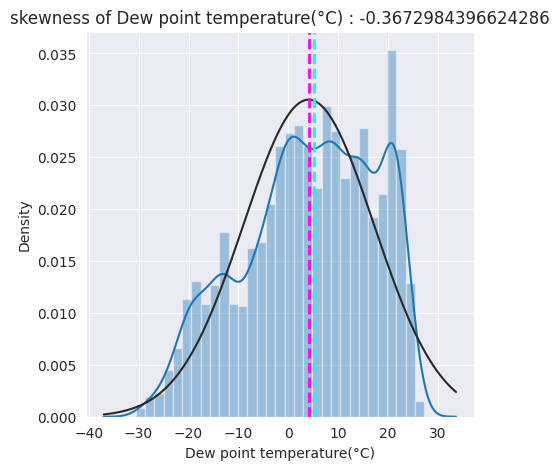

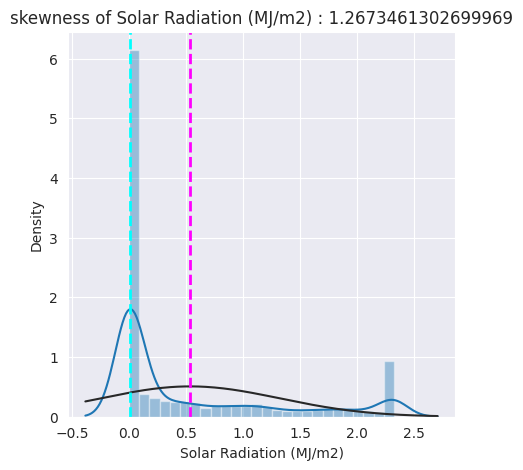

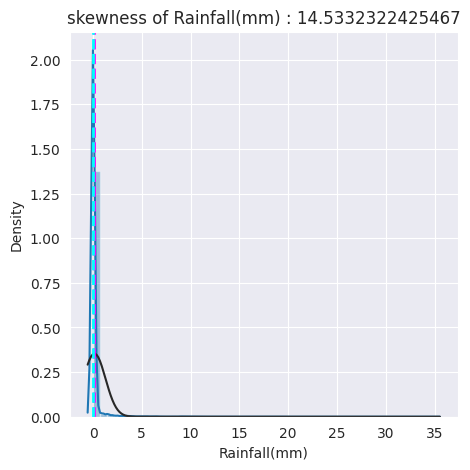

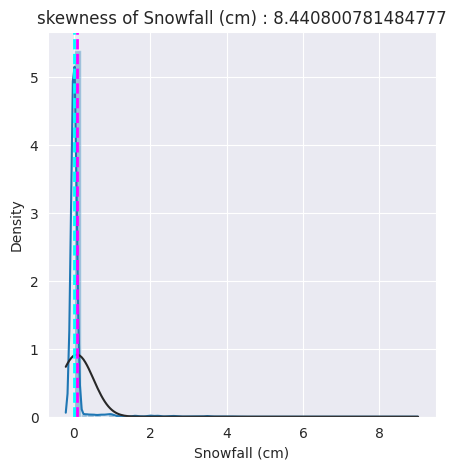

In [ ]:
# Ckecking distribution of numerical feature
# Defining numerical contineous variables
num_variables=['Rented Bike Count', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']

# Plotting distribution plot for each numerical variables
from scipy.stats import norm
for var in num_variables:
    plt.figure(figsize=(5,5))
    ax=sns.distplot(bike_df[var], fit=norm)
    ax.axvline(bike_df[var].mean(), color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(bike_df[var].median(), color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(f'skewness of {var} : {bike_df[var].skew()}')
    plt.show()

In [ ]:
# import module
from tabulate import tabulate

# assign data
mydata = [
    ["Rented Bike Count", "1.0032657583531357", 'Slightly'],
    ["Temperature(°C", "-0.19832553450003293", 'Nearly Symmetrical'],
    ["Humidity(%)", "0.05957897257708239",'Nearly Symmetrical'],
      ["Wind speed (m/s)", "0.7147003872817881",'Slightly'],
    ['Visibility (10m)','-0.7017864489502947','Slightly'],['Dew point temperature(°C)',' -0.3672984396624286', 'Nearly Symmetrical'],['Solar Radiation (MJ/m2)','1.2673461302699969', 'Slightly'],
    ['Rainfall(mm)','14.5332','Large'], ['Snowfall (cm)','8.440800781484777', 'Large']
]

# create header
head = ["Feature Name", "Skew", 'Skew-Type']

# display table
print(tabulate(mydata, headers=head, tablefmt="grid"))

+---------------------------+-----------+--------------------+
| Feature Name              |      Skew | Skew-Type          |
+===========================+===========+====================+
| Rented Bike Count         |  1.00327  | Slightly           |
+---------------------------+-----------+--------------------+
| Temperature(°C            | -0.198326 | Nearly Symmetrical |
+---------------------------+-----------+--------------------+
| Humidity(%)               |  0.059579 | Nearly Symmetrical |
+---------------------------+-----------+--------------------+
| Wind speed (m/s)          |  0.7147   | Slightly           |
+---------------------------+-----------+--------------------+
| Visibility (10m)          | -0.701786 | Slightly           |
+---------------------------+-----------+--------------------+
| Dew point temperature(°C) | -0.367298 | Nearly Symmetrical |
+---------------------------+-----------+--------------------+
| Solar Radiation (MJ/m2)   |  1.26735  | Slightly     

In [ ]:
# Transforming distribution to normal using different transformations

# For positively skewed data
bike_df['Rented Bike Count']=(bike_df['Rented Bike Count']+1).transform(np.sqrt)
bike_df['Wind speed (m/s)']=(bike_df['Wind speed (m/s)']+1).transform(np.log)
bike_df['Solar Radiation (MJ/m2)']=(bike_df['Solar Radiation (MJ/m2)']+1).transform(np.log)

# For negatively skewed data
bike_df['Visibility (10m)']=(max(bike_df['Visibility (10m)']+1)-bike_df['Visibility (10m)']).transform(np.sqrt)

# For large skewed data
bike_df['Rainfall(mm)']=(bike_df['Rainfall(mm)']+1).transform(np.log)
bike_df['Snowfall (cm)']=(bike_df['Snowfall (cm)']+1).transform(np.log)

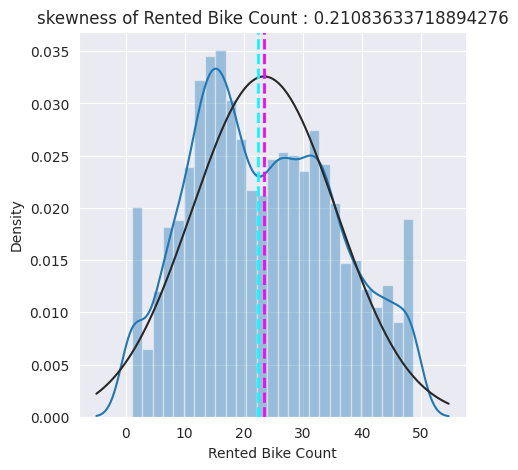

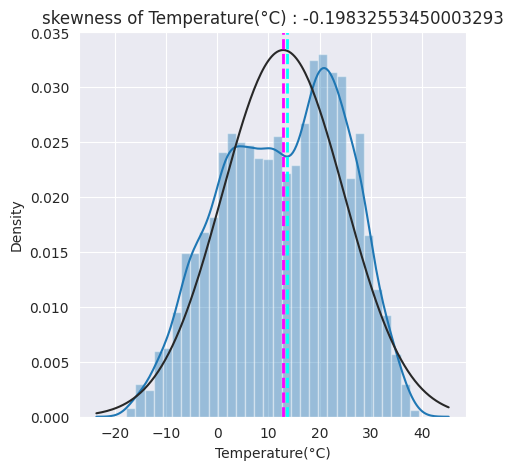

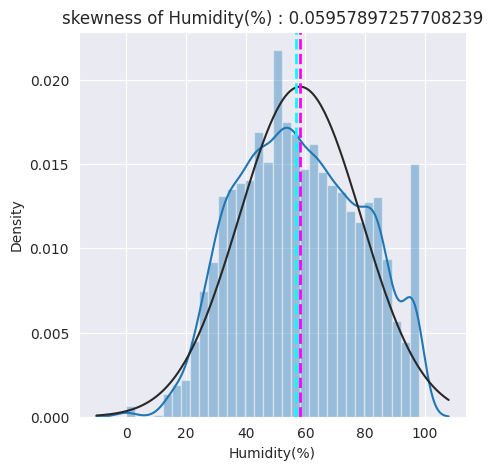

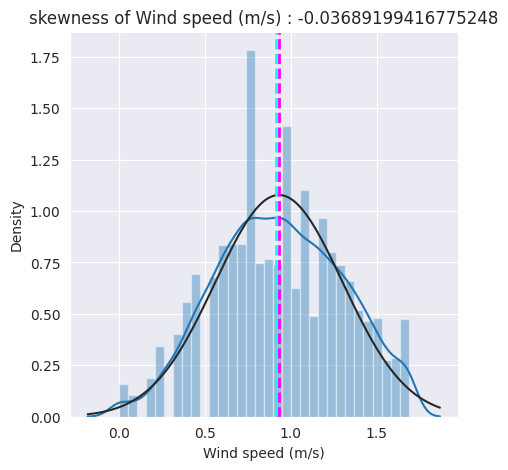

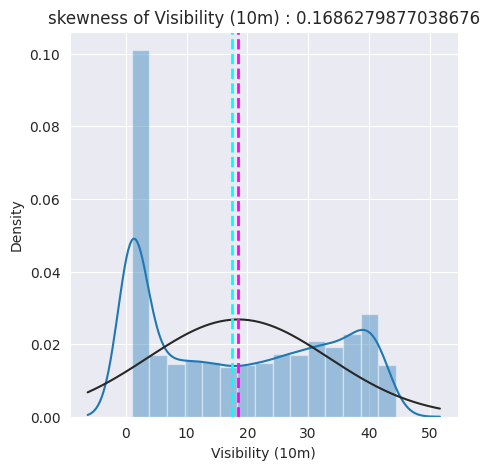

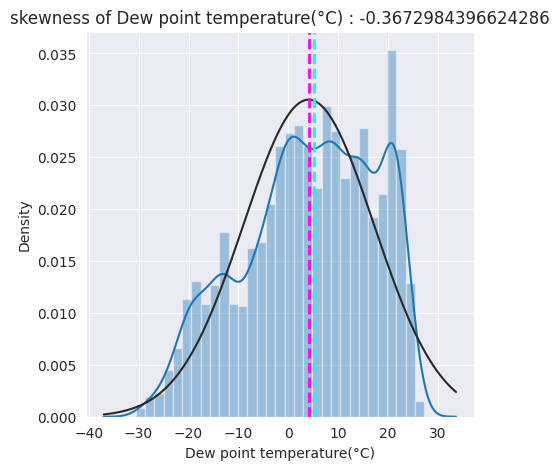

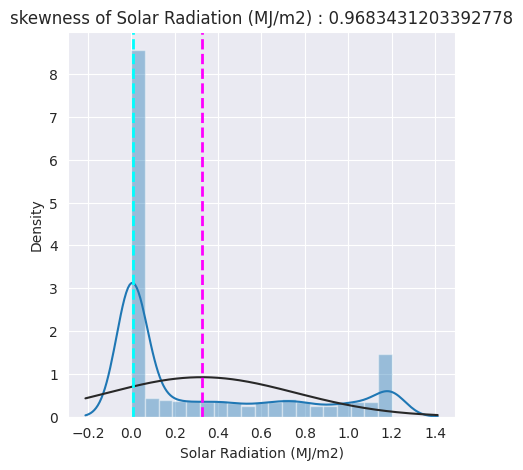

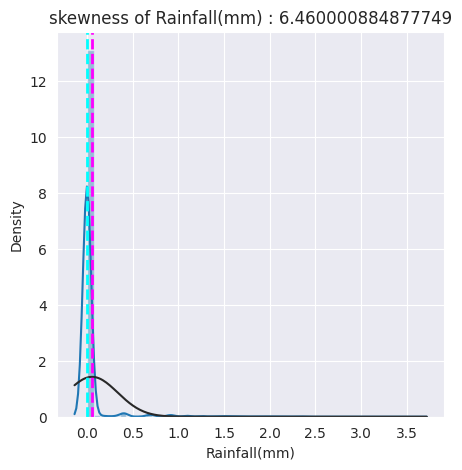

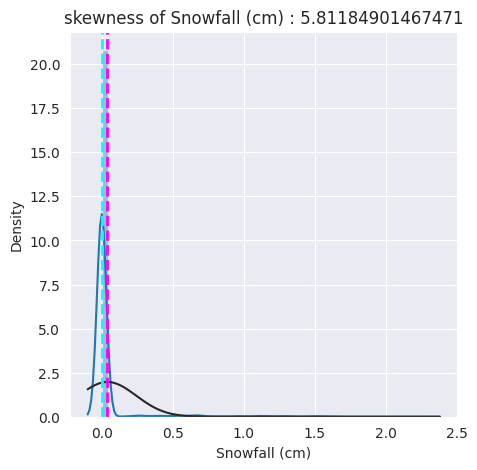

In [ ]:
# Checking distribution after transformed data to normal distribution
from scipy.stats import norm
for var in num_variables:
    plt.figure(figsize=(5,5))
    ax=sns.distplot(bike_df[var], fit=norm)
    ax.axvline(bike_df[var].mean(), color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(bike_df[var].median(), color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(f'skewness of {var} : {bike_df[var].skew()}')
    plt.show()

By applying log transformations, we give variables a distribution that is close to being normal.

**Checking relationship between independent and dependent variables is linear**

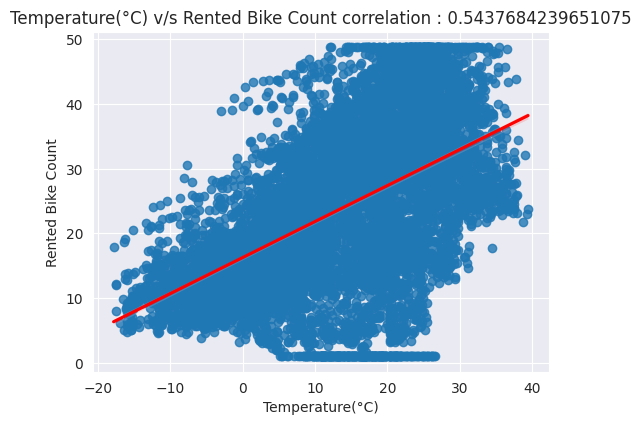

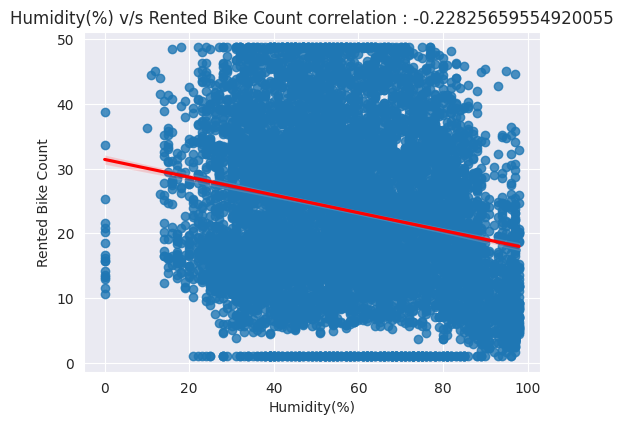

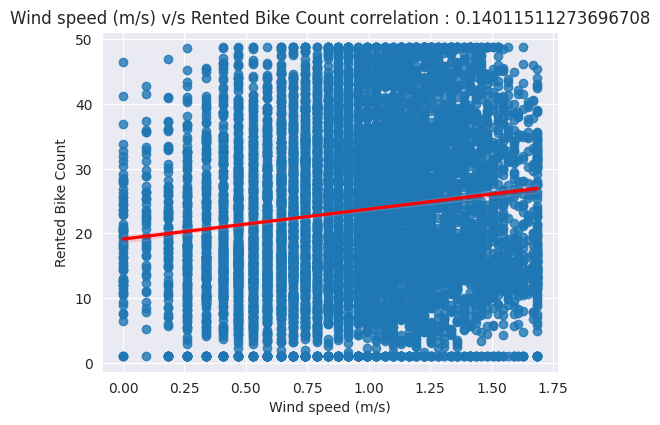

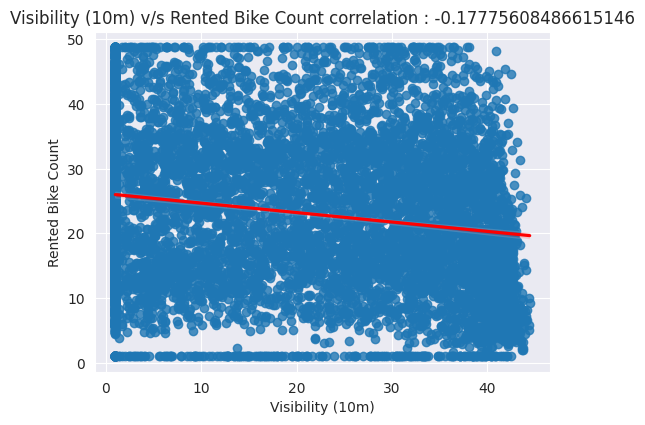

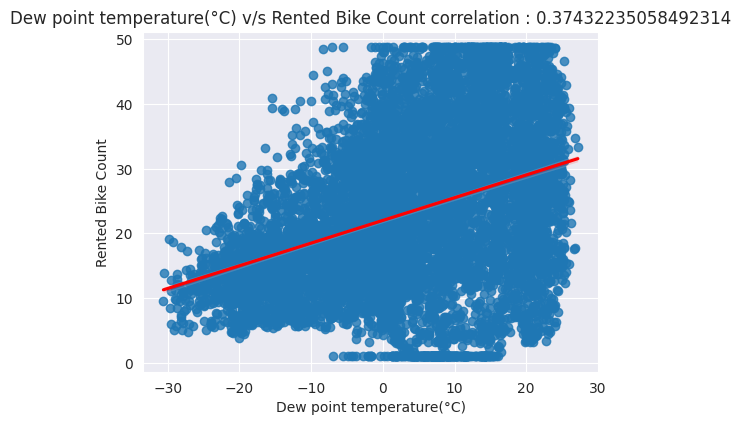

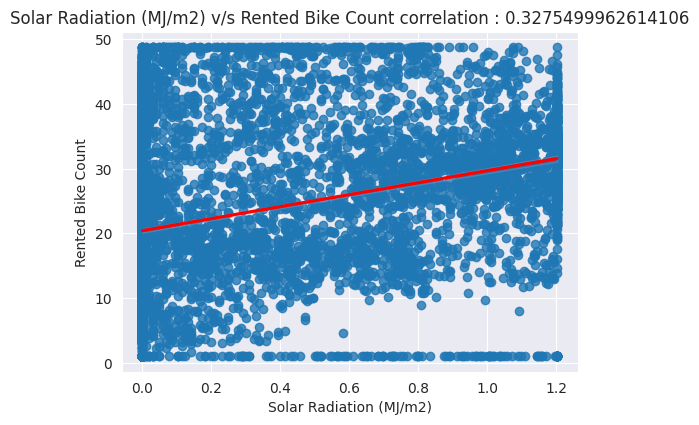

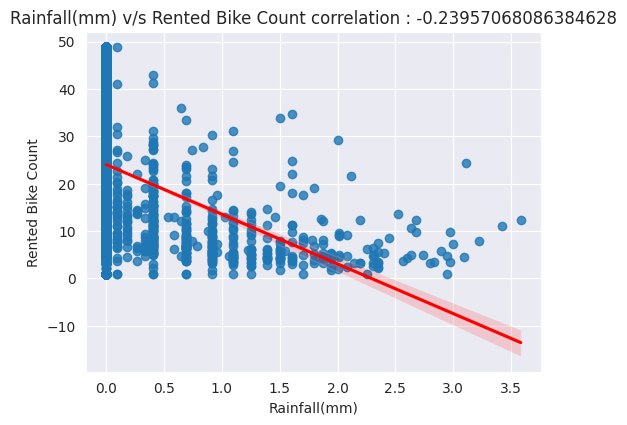

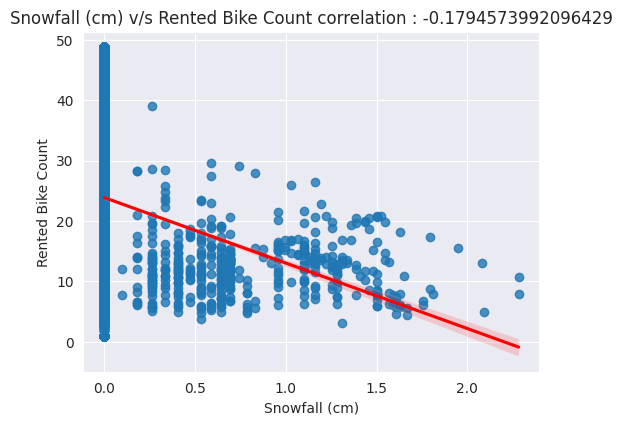

In [ ]:
# Plotting regression plot
for n, var in enumerate([var for var in num_variables if var not in ['Rented Bike Count']]):
    plt.figure(figsize=(20,15))
    plt.subplot(3,3,n+1)
    # Finding correlation of independant variables with dependant variable
    dependant_var=bike_df['Rented Bike Count']
    independant_var=bike_df[var]
    correlation=independant_var.corr(dependant_var)
    ax=sns.regplot(x=bike_df[var], y=bike_df['Rented Bike Count'], data=bike_df, line_kws={"color": "red"})
    ax.set_title(f'{var} v/s Rented Bike Count correlation : {correlation}')
    plt.show()

All numerical variables are correlated with the dependent variable Rented Bike Count, but Solar Radiation (MJ/m2), Dew Point Temperature (°C) and Temperature (°C) are highly correlated with the dependent variable, which is good for a linear machine learning model.

**Checking multicollinearity in independant variables**

### **Correlation Heatmap**

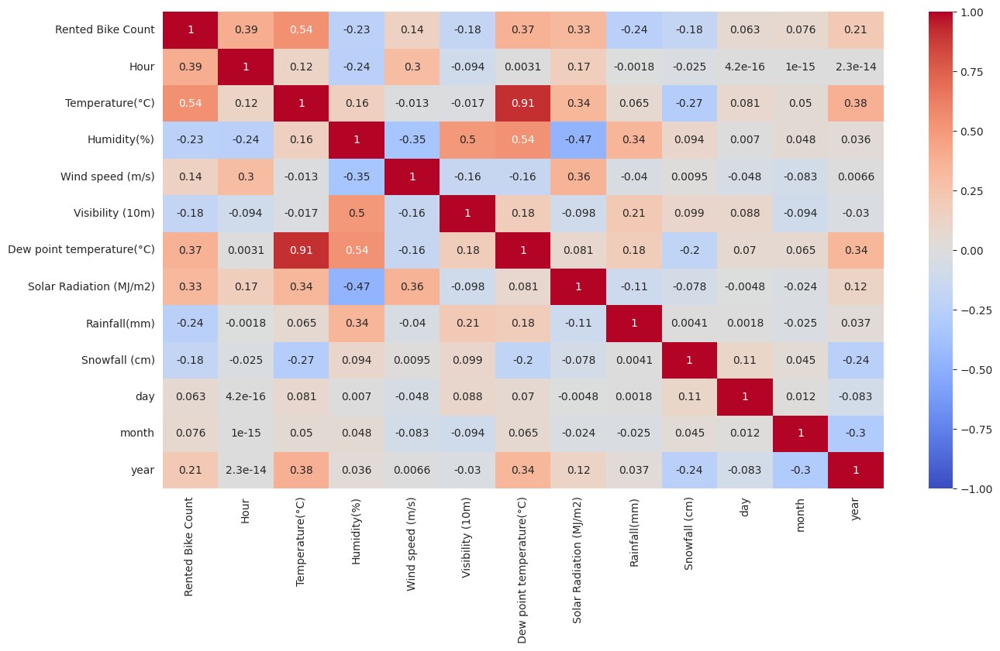

In [ ]:
# Plotting a correlation heatmap for the dataset
plt.figure(figsize=(15,8))
correlation=bike_df.corr()
sns.heatmap(correlation, vmin=-1, cmap='coolwarm', annot=True)
plt.show()

Observations :

Dew point temperature (°C) and temperature (°C) have a strong correlation. A moderate correlation exists between humidity (%) and dew point temperature (°C). The variables year and Dew point temperature (°C) have a weak correlation.

### **Variance inflation factor(VIF)**

VIF stands for Variation Inflation Factor. It is a statistical measure used to assess multicollinearity in regression analysis. Multicollinearity refers to high correlation or linear dependence between predictor variables in a regression model.


* VIF = 1: No multicollinearity. The variance of the coefficient estimate is not inflated.
* VIF > 1: Moderate multicollinearity. The variance of the coefficient estimate is moderately inflated.
* VIF > 5: High multicollinearity. The variance of the coefficient estimate is significantly inflated, and this might be a cause for concern.

In [ ]:
# Variance inflation factor(VIF) to detects multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
    """
    Calculate the Variance Inflation Factor (VIF) for each variable in the given DataFrame.

    Parameters:
        X (pandas.DataFrame): The input DataFrame containing the variables for which VIF is to be calculated.

    Returns:
        pandas.DataFrame: A DataFrame containing the variables and their corresponding VIF values.

    """
    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [ ]:
# Calculating Variance inflation factor for dataset
#The VIF function expects numeric values, so ensure that the columns you're using for VIF calculation contain numeric data.
#If any columns have non-numeric or mixed data types, it can lead to this error.
calc_vif(bike_df[[i for i in bike_df.describe().columns if i not in ['Rented Bike Count']]])

,variables,VIF
0,Hour,4.455048
1,Temperature(°C),187.590788
2,Humidity(%),188.670145
3,Wind speed (m/s),9.666953
4,Visibility (10m),3.894560
5,Dew point temperature(°C),126.533084
6,Solar Radiation (MJ/m2),3.254420
7,Rainfall(mm),1.238572
8,Snowfall (cm),1.198864
9,day,4.401755


Variable year have a high variance inflation factor, so we can remove it.


In [ ]:
# Dropping year feature to reduce Variance inflation factor
calc_vif(bike_df[[i for i in bike_df.describe().columns if i not in ['Rented Bike Count','year']]])

,variables,VIF
0,Hour,4.438523
1,Temperature(°C),26.138761
2,Humidity(%),13.411031
3,Wind speed (m/s),9.519361
4,Visibility (10m),3.873580
5,Dew point temperature(°C),13.302493
6,Solar Radiation (MJ/m2),3.232551
7,Rainfall(mm),1.173579
8,Snowfall (cm),1.186388
9,day,4.363200


Variable Temperature(°C), Humidity(%) and Dew point temperature(°C) have a high variance inflation factor, so we can remove Dew point temperature(°C) variable to reduce VIF

In [ ]:
# Dropping 'Dew point temperature(°C)' feature to reduce Variance inflation factor
calc_vif(bike_df[[i for i in bike_df.describe().columns if i not in ['Rented Bike Count','year','Dew point temperature(°C)']]])

,variables,VIF
0,Hour,4.078444
1,Temperature(°C),3.457003
2,Humidity(%),12.542367
3,Wind speed (m/s),7.525551
4,Visibility (10m),3.832421
5,Solar Radiation (MJ/m2),2.811538
6,Rainfall(mm),1.149039
7,Snowfall (cm),1.173295
8,day,3.879087
9,month,4.328055


Variable 'Humidity(%)' have a high variance inflation factor, so we can remove it.

In [ ]:
# Dropping 'Dew point temperature(°C)' feature to reduce Variance inflation factor
calc_vif(bike_df[[i for i in bike_df.describe().columns if i not in ['Rented Bike Count','year','Dew point temperature(°C)', 'Humidity(%)']]])

,variables,VIF
0,Hour,4.072834
1,Temperature(°C),2.693503
2,Wind speed (m/s),6.246470
3,Visibility (10m),2.375806
4,Solar Radiation (MJ/m2),2.104801
5,Rainfall(mm),1.113715
6,Snowfall (cm),1.155757
7,day,3.762873
8,month,3.578675


From above, variables year,Dew point temperature(°C), and Humidity(%) have a high variance inflation factor, so we can remove them.

In [ ]:
# Drop high VIF variables from dataset
bike_df.drop(columns=['year','Dew point temperature(°C)', 'Humidity(%)'], axis=1,inplace=True)

In [ ]:
# Checking dataset
bike_df.head()

,Rented Bike Count,Hour,Temperature(°C),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,day,month
0,15.968719,0,-5.2,1.163151,1.0,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1
1,14.317821,1,-5.5,0.587787,1.0,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1
2,13.190906,2,-6.0,0.693147,1.0,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1
3,10.392305,3,-6.2,0.641854,1.0,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1
4,8.888194,4,-6.0,1.193922,1.0,0.0,0.0,0.0,Winter,No Holiday,Yes,12,1


###**Features encoding**

In [ ]:
# Addressing categorical variables from the dataset
categorical_variables=bike_df.describe(include=['object']).columns
categorical_variables

Index(['Seasons', 'Holiday', 'Functioning Day'], dtype='object')

In [ ]:
# Checking categories in each categorical features
for var in categorical_variables:
    print(bike_df[var].value_counts())
    print('--'*50)

Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: Seasons, dtype: int64
----------------------------------------------------------------------------------------------------
No Holiday    8328
Holiday        432
Name: Holiday, dtype: int64
----------------------------------------------------------------------------------------------------
Yes    8465
No      295
Name: Functioning Day, dtype: int64
----------------------------------------------------------------------------------------------------


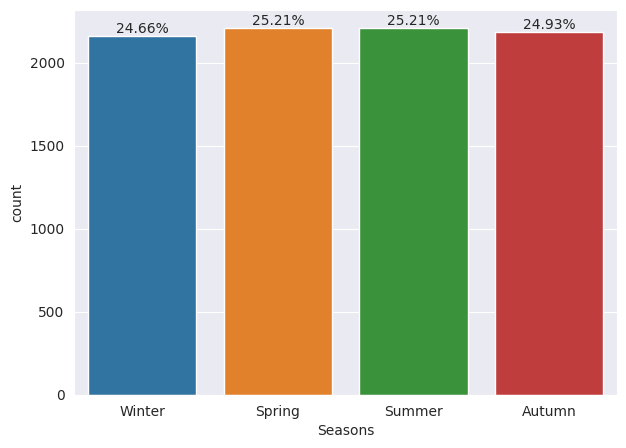

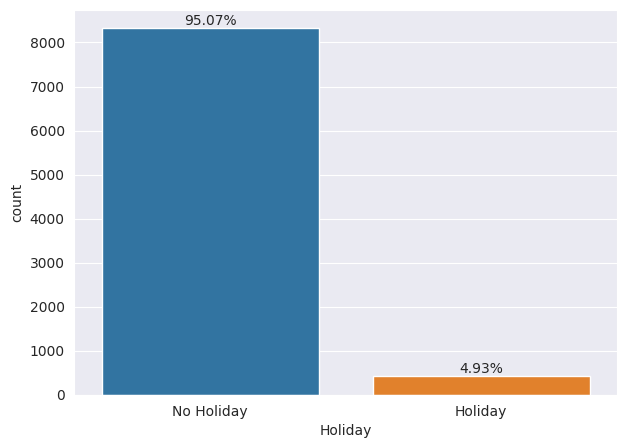

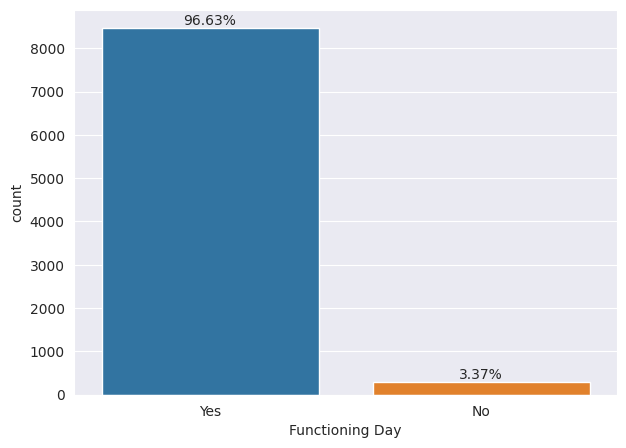

In [ ]:
# Plotting count plot for each categories in categorical_variables
for var in categorical_variables:
    plt.figure(figsize=(7,5))
    plot=plt.subplot(111)
    ax=sns.countplot(x = bike_df[var])
    annot_percent(plot)
    plt.show()

Because categorical variables have a limited number of categories, label encoding can be used instead of one-hot encoding. One hot encoding is used when there are quite large categories in categorical variables.

In [ ]:
# Encoding categorical_variables using label encoding
# Mapping the categorical variables
bike_df['Seasons'] = bike_df['Seasons'].map({'Spring':1,'Summer':2,'Autumn':3,'Winter':4})
bike_df['Holiday'] = bike_df['Holiday'].map({'No Holiday':0,'Holiday':1})
bike_df['Functioning Day'] = bike_df['Functioning Day'].map({'Yes':1,'No':0})

In [ ]:
# Checking basic information of dataset
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Rented Bike Count        8760 non-null   float64
 1   Hour                     8760 non-null   int64  
 2   Temperature(°C)          8760 non-null   float64
 3   Wind speed (m/s)         8760 non-null   float64
 4   Visibility (10m)         8760 non-null   float64
 5   Solar Radiation (MJ/m2)  8760 non-null   float64
 6   Rainfall(mm)             8760 non-null   float64
 7   Snowfall (cm)            8760 non-null   float64
 8   Seasons                  8760 non-null   int64  
 9   Holiday                  8760 non-null   int64  
 10  Functioning Day          8760 non-null   int64  
 11  day                      8760 non-null   int64  
 12  month                    8760 non-null   int64  
dtypes: float64(7), int64(6)
memory usage: 889.8 KB


In [ ]:
# Final Dataset
bike_df.head()

,Rented Bike Count,Hour,Temperature(°C),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,day,month
0,15.968719,0,-5.2,1.163151,1.0,0.0,0.0,0.0,4,0,1,12,1
1,14.317821,1,-5.5,0.587787,1.0,0.0,0.0,0.0,4,0,1,12,1
2,13.190906,2,-6.0,0.693147,1.0,0.0,0.0,0.0,4,0,1,12,1
3,10.392305,3,-6.2,0.641854,1.0,0.0,0.0,0.0,4,0,1,12,1
4,8.888194,4,-6.0,1.193922,1.0,0.0,0.0,0.0,4,0,1,12,1


This is the final dataset we will use to build a machine learning model.

###**Data Splitting**

In [ ]:
# Separating independant variables and dependant variable

# Creating the dataset with all dependent variables
dependent_variable = 'Rented Bike Count'

# Creating the dataset with all independent variables
independent_variables = list(set(bike_df.columns.tolist()) - {dependent_variable})

# Create the data of independent variables
X = bike_df[independent_variables].values
# Create the data of dependent variable
y = bike_df[dependent_variable].values

In [ ]:
# Splitting dataset into training set and test set
from sklearn.model_selection import train_test_split, GridSearchCV

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Checking shape of split
print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (7008, 12)
Shape of X_test : (1752, 12)
Shape of y_train : (7008,)
Shape of y_test : (1752,)


We divided the dataset into 20% for model testing and 80% for training.

In [ ]:
# Checking values of splitted dataset
X_train[0:5]

array([[15.        , 13.2       ,  0.70803579,  0.        ,  1.        ,
         1.58923521, 35.80502758,  0.        ,  3.        , 11.        ,
         0.        , 16.        ],
       [ 9.        , 22.9       ,  0.56531381,  0.        ,  1.        ,
         0.99325177, 38.249183  ,  0.        ,  2.        ,  6.        ,
         0.        , 29.        ],
       [19.        , 11.2       ,  0.        ,  0.        ,  1.        ,
         0.87546874, 33.64520768,  0.        ,  3.        , 11.        ,
         0.        , 15.        ],
       [23.        , -2.6       ,  0.        ,  0.        ,  1.        ,
         1.09861229, 23.8117618 ,  0.        ,  4.        ,  2.        ,
         0.        ,  2.        ],
       [22.        , 27.2       ,  0.        ,  0.        ,  1.        ,
         0.91629073, 31.55946768,  0.        ,  2.        ,  7.        ,
         0.        , 18.        ]])

In [ ]:
# Checking values of splitted dataset
X_test[0:5]

array([[ 8.        , 27.2       ,  0.53062825,  0.        ,  1.        ,
         1.02961942,  1.41421356,  0.        ,  2.        , 10.        ,
         0.        ,  8.        ],
       [12.        , 32.6       ,  1.20146967,  0.        ,  1.        ,
         1.13140211, 34.6554469 ,  0.        ,  2.        ,  7.        ,
         0.        , 20.        ],
       [14.        , 34.        ,  0.98581679,  0.        ,  1.        ,
         0.78845736, 16.03121954,  0.        ,  2.        ,  7.        ,
         0.        ,  8.        ],
       [18.        , 16.9       ,  0.10436002,  0.        ,  1.        ,
         0.87546874, 19.07878403,  0.        ,  3.        , 10.        ,
         0.        , 16.        ],
       [ 7.        ,  6.4       ,  0.17395331,  0.        ,  1.        ,
         0.69314718, 24.55605832,  0.        ,  1.        ,  4.        ,
         0.        , 18.        ]])

###**Data Scaling**

In [ ]:
#Transforming data
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
#By using fit_transform() on the training data, the scaler adapts and learns the scaling parameters specific to the training data.
#This ensures that the scaling is consistent across the training set.
X_test = scaler.transform(X_test)
#By using transform() on the test data, the scaler applies the same scaling as performed on the training data.
#This ensures that the test data is transformed consistently with the training data.

This scaler is commonly used to scale features to a specified range, often between 0 and 1. MinMaxScaler preserves the shape of the original distribution. It doesn't meaningfully change the information embedded in the original data. So we used MinMaxScaler for scaling the dataset.

In [ ]:
# Checking values of splitted dataset after normalisation
X_train[0:5]

array([[0.65217391, 0.54195804, 0.58930809, 0.        , 1.        ,
        0.94238389, 0.80265925, 0.        , 0.66666667, 0.90909091,
        0.        , 0.5       ],
       [0.39130435, 0.71153846, 0.47051858, 0.        , 1.        ,
        0.58897793, 0.85902536, 0.        , 0.33333333, 0.45454545,
        0.        , 0.93333333],
       [0.82608696, 0.50699301, 0.        , 0.        , 1.        ,
        0.51913501, 0.75285037, 0.        , 0.66666667, 0.90909091,
        0.        , 0.46666667],
       [1.        , 0.26573427, 0.        , 0.        , 1.        ,
        0.65145456, 0.52607548, 0.        , 1.        , 0.09090909,
        0.        , 0.03333333],
       [0.95652174, 0.78671329, 0.        , 0.        , 1.        ,
        0.54334162, 0.70474989, 0.        , 0.33333333, 0.54545455,
        0.        , 0.56666667]])

In [ ]:
# Checking values of splitted dataset after normalisation
X_test[0:5]

array([[0.34782609, 0.78671329, 0.44164931, 0.        , 1.        ,
        0.6105432 , 0.00955242, 0.        , 0.33333333, 0.81818182,
        0.        , 0.23333333],
       [0.52173913, 0.88111888, 1.        , 0.        , 1.        ,
        0.67089825, 0.77614809, 0.        , 0.33333333, 0.54545455,
        0.        , 0.63333333],
       [0.60869565, 0.90559441, 0.82050909, 0.        , 1.        ,
        0.46753905, 0.34664381, 0.        , 0.33333333, 0.54545455,
        0.        , 0.23333333],
       [0.7826087 , 0.60664336, 0.0868603 , 0.        , 1.        ,
        0.51913501, 0.41692549, 0.        , 0.66666667, 0.81818182,
        0.        , 0.5       ],
       [0.30434783, 0.42307692, 0.14478377, 0.        , 1.        ,
        0.41102207, 0.54324014, 0.        , 0.        , 0.27272727,
        0.        , 0.56666667]])

## **ML Model Implementation**

In [ ]:
# Definig function for evaluating model

# Importing necessary librery
from sklearn import metrics

# Evaluate Metrics
def evaluate_model(true, predicted):
  """
    Evaluate the performance of a regression model by calculating various metrics.

    Parameters:
        true (array-like): The true values of the target variable.
        predicted (array-like): The predicted values of the target variable.

    Prints:
        The following metrics are printed:
        - Mean squared error (MSE): The average of the squared differences between the true and predicted values.
        - Root mean squared error (RMSE): The square root of the MSE, providing a measure of the average magnitude of the errors.
        - Mean absolute error (MAE): The average of the absolute differences between the true and predicted values.
        - R2 Square: The coefficient of determination, indicating the proportion of the variance in the target variable that can be explained by the model.

    Returns:
        None  """
  mse = metrics.mean_squared_error(true, predicted)
  rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
  mae = metrics.mean_absolute_error(true, predicted)
  r2_square = metrics.r2_score(true, predicted)
  print('Mean squared error (MSE):', mse)
  print('Root mean squared error (RMSE):', rmse)
  print('Mean absolute error (MAE):', mae)
  print('R2 Square', r2_square)
  print('____________________________________')

# Evaluating Adjusted R2
from sklearn.metrics import r2_score

def calculate_adjusted_r2(true, predicted, num_features):
  """ Calculates the adjusted R^2 value, which is a modification of the R^2 value
    that adjusts for the number of features in the model.

  Args:
        true (array-like): The true values of the target variable.
        predicted (array-like): The predicted values of the target variable.
        num_features (int): The number of features used in the model.

  Returns:
        adjusted_r2 (float): The adjusted R^2 value. """

  r2 = r2_score(true, predicted)
  adjusted_r2 = 1 - (1 - r2) * ((len(true) - 1) / (len(true) - num_features - 1))
  return adjusted_r2


### **Linear Regression**

**train_test_split**

In [ ]:
# Fitting Regression model to training set
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Score of the model
lin_reg_score= lin_reg.score(X_train, y_train)
print(f'Score of the model : {lin_reg_score}')

Score of the model : 0.6395792892371408


In [ ]:
# Intercept
lin_reg.intercept_

-21.271671900902447

In [ ]:
# Coefficients
lin_reg.coef_

array([ 12.88441975,  26.79663453,   2.4926218 ,  -3.22830156,
        25.26786083,   0.1281394 ,  -3.34365943,  -5.11490368,
        -2.18209128,   2.8318968 , -38.99734556,   1.1678821 ])

In [ ]:
# Predicting results for train and test set

y_train_pred = lin_reg.predict(X_train)
y_test_pred= lin_reg.predict(X_test)

In [ ]:
# Evaluating model

print(f'Training set evaluation result\n____________________________________')
evaluate_model(y_train, y_train_pred)
print(f'Test set evaluation result\n____________________________________')
evaluate_model(y_test, y_test_pred)

Training set evaluation result
____________________________________
Mean squared error (MSE): 54.139716745066536
Root mean squared error (RMSE): 7.357969607511745
Mean absolute error (MAE): 5.756414898386549
R2 Square 0.6395792892371408
____________________________________
Test set evaluation result
____________________________________
Mean squared error (MSE): 56.11071888143365
Root mean squared error (RMSE): 7.49070883704831
Mean absolute error (MAE): 5.790575510361677
R2 Square 0.6231292158906648
____________________________________


In [ ]:
# Evaluate on the train set
train_adjusted_r2 = calculate_adjusted_r2(y_train, y_train_pred, X_train.shape[1])
print(f'Train set evaluation result\n{"_" * 36}')
print(f"Adjusted R2: {train_adjusted_r2}")
print('_' * 36)

# Evaluate on the test set
test_adjusted_r2 = calculate_adjusted_r2(y_test, y_test_pred, X_test.shape[1])
print(f'Test set evaluation result\n{"_" * 36}')
print(f"Adjusted R2: {test_adjusted_r2}")
print('_' * 36)

Train set evaluation result
____________________________________
Adjusted R2: 0.6389609835146026
____________________________________
Test set evaluation result
____________________________________
Adjusted R2: 0.6205286124350512
____________________________________


In [ ]:
# Finding mean of Residuals
print(f'Mean of Residuals for test set\n____________________________________')
residuals = y_test-y_test_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals for test set
____________________________________
Mean of Residuals 0.18471893803611222


Note :- Mean of Residuals is very very close to zero, so all good here.

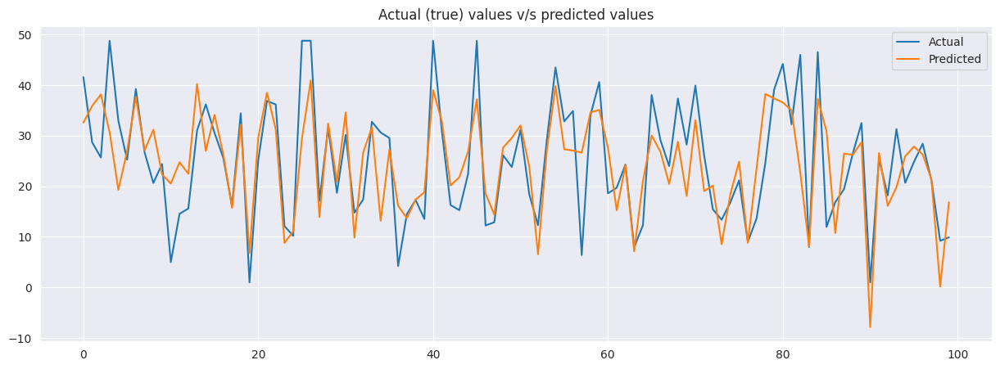

In [ ]:
# Plotting graph of Actual (true) values and predicted values

plt.figure(figsize=(15,5))
plt.plot(y_test[0:100])
plt.plot(y_test_pred[0:100])
plt.title('Actual (true) values v/s predicted values')
plt.legend(["Actual", "Predicted"])
plt.show()

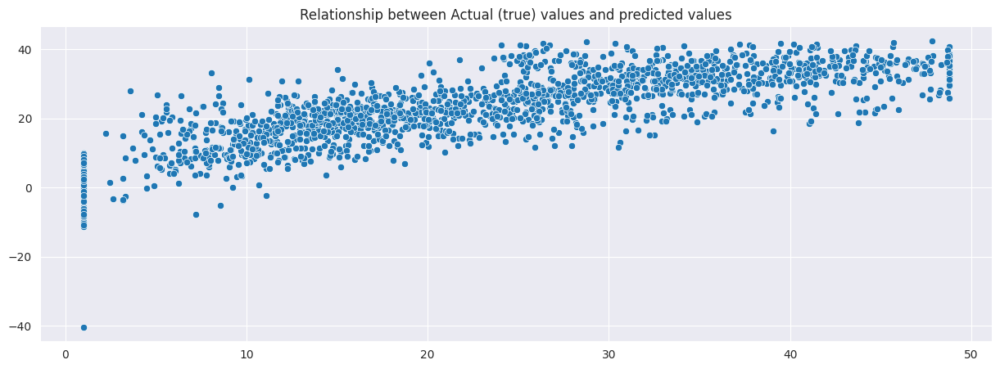

In [ ]:
# Plotting graph of Actual (true) values and predicted values

plt.figure(figsize=(15,5))
sns.scatterplot(x=y_test, y=y_test_pred)
plt.title('Relationship between Actual (true) values and predicted values')
plt.show()

1. We get the conclusion that the linear model fails to perform well based on the above model score and graph.
2. Model provided only 62% of the performance score, and the mean of the residual was not close to zero, indicating that the model was not well trained to make predictions.

### **Lasso Regression (L1)**

**Cross Validation**

In [ ]:
# Fitting lasso regression model to training set

from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.0001 , max_iter= 3000, random_state=100)
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100,0.0014]}
lasso_reg = GridSearchCV(lasso, parameters, verbose=1, scoring='neg_mean_squared_error', cv=5)
lasso_reg.fit(X_train, y_train)

Fitting 5 folds for each of 21 candidates, totalling 105 fits


GridSearchCV(cv=5,
             estimator=Lasso(alpha=0.0001, max_iter=3000, random_state=100),
             param_grid={'alpha': [1e-15, 1e-13, 1e-10, 1e-08, 1e-05, 0.0001,
                                   0.001, 0.01, 0.1, 1, 5, 10, 20, 30, 40, 45,
                                   50, 55, 60, 100, 0.0014]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
lasso_reg_best_est = lasso_reg.best_estimator_
print(f'The best estimator values : {lasso_reg_best_est}')

The best estimator values : Lasso(alpha=0.0014, max_iter=3000, random_state=100)


In [ ]:
# best fit alpha value
lasso_reg_best_params =  lasso_reg.best_params_
print(f'The best fit alpha value : {lasso_reg_best_params}')

The best fit alpha value : {'alpha': 0.0014}


In [ ]:
# Mean cross-validated score of the best_estimator of model
lasso_reg_score = lasso_reg.best_score_
print(f" The negative mean squared error is: {lasso_reg_score}")

 The negative mean squared error is: -54.4235229883623


In [ ]:
# Predicting results for train and test set
y_train_pred=lasso_reg.predict(X_train)
y_test_pred=lasso_reg.predict(X_test)

In [ ]:
# Evaluating model
print(f'Training set evaluation result\n____________________________________')
evaluate_model(y_train, y_train_pred)
print(f'Test set evaluation result\n____________________________________')
evaluate_model(y_test, y_test_pred)

Training set evaluation result
____________________________________
Mean squared error (MSE): 54.140528713831976
Root mean squared error (RMSE): 7.358024783447795
Mean absolute error (MAE): 5.757334775104501
R2 Square 0.639573883771853
____________________________________
Test set evaluation result
____________________________________
Mean squared error (MSE): 56.1013905995576
Root mean squared error (RMSE): 7.490086154348132
Mean absolute error (MAE): 5.79059102459088
R2 Square 0.6231918698180268
____________________________________


In [ ]:
# Evaluate on the train set
train_adjusted_r2 = calculate_adjusted_r2(y_train, y_train_pred, X_train.shape[1])
print(f'Train set evaluation result\n{"_" * 36}')
print(f"Adjusted R2: {train_adjusted_r2}")
print('_' * 36)

# Evaluate on the test set
test_adjusted_r2 = calculate_adjusted_r2(y_test, y_test_pred, X_test.shape[1])
print(f'Test set evaluation result\n{"_" * 36}')
print(f"Adjusted R2: {test_adjusted_r2}")
print('_' * 36)

Train set evaluation result
____________________________________
Adjusted R2: 0.6389555687761792
____________________________________
Test set evaluation result
____________________________________
Adjusted R2: 0.6205916987069378
____________________________________


In [ ]:
# Finding mean of Residuals
print(f'Mean of Residuals for test set\n____________________________________')
residuals = y_test-y_test_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals for test set
____________________________________
Mean of Residuals 0.18495609649107383


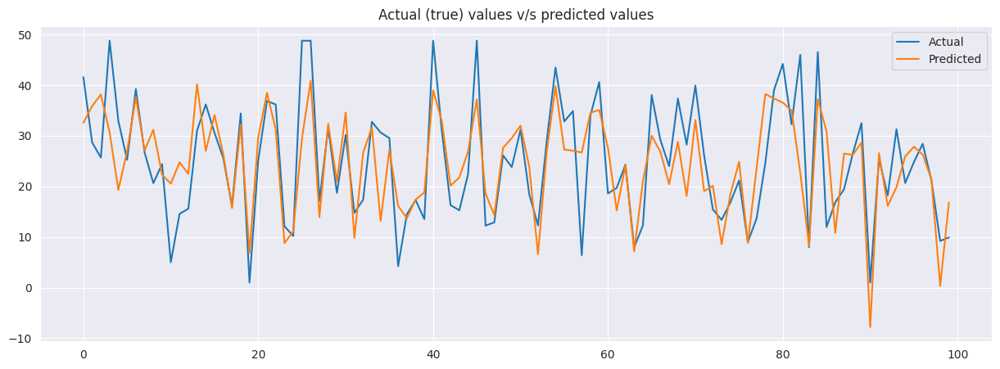

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
plt.plot(y_test[0:100])
plt.plot(y_test_pred[0:100])
plt.title('Actual (true) values v/s predicted values')
plt.legend(["Actual", "Predicted"])
plt.show()

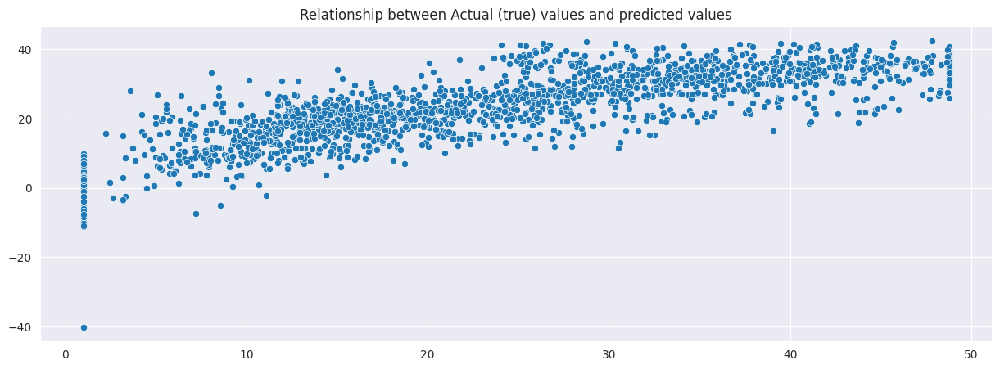

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
sns.scatterplot(x=y_test, y= y_test_pred)
plt.title('Relationship between Actual (true) values and predicted values')
plt.show()

1. The Lasso (L1) regression model gave the same performance as the above linear regression model.
2. The relationship between actual and predicted values suggests that the model has been slightly improved.
3. The model provided only 62% of the performance score, and the mean of the residual was not close to zero, indicating that the model was not well trained to make predictions.


### **Ridge Regression (L2)**

Cross Validation

In [ ]:
# Fitting ridge regression model to training set
from sklearn.linear_model import Ridge
ridge = Ridge(random_state=0)
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100,0.0014]}
ridge_reg = GridSearchCV(ridge, parameters, verbose=1, scoring='neg_mean_squared_error', cv=5)
ridge_reg.fit(X_train, y_train)

Fitting 5 folds for each of 21 candidates, totalling 105 fits


GridSearchCV(cv=5, estimator=Ridge(random_state=0),
             param_grid={'alpha': [1e-15, 1e-13, 1e-10, 1e-08, 1e-05, 0.0001,
                                   0.001, 0.01, 0.1, 1, 5, 10, 20, 30, 40, 45,
                                   50, 55, 60, 100, 0.0014]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
# Best estimators
ridge_reg_best_est = ridge_reg.best_estimator_
print(f'The best estimator values : {ridge_reg_best_est}')

The best estimator values : Ridge(alpha=1, random_state=0)


In [ ]:
# best fit alpha value
ridge_reg_best_params = ridge_reg.best_params_
print(f'The best fit alpha value : {ridge_reg_best_params}')

The best fit alpha value : {'alpha': 1}


In [ ]:
# Mean cross-validated score of the best_estimator of model
ridge_reg_score = ridge_reg.best_score_
print(f" The negative mean squared error is: {ridge_reg_score}")

 The negative mean squared error is: -54.42323488197028


In [ ]:
# Predicting results for train and test set
y_train_pred = ridge_reg.predict(X_train)
y_test_pred = ridge_reg.predict(X_test)

In [ ]:
# Evaluating model
print(f'Training set evaluation result\n____________________________________')
evaluate_model(y_train, y_train_pred)
print(f'Test set evaluation result\n____________________________________')
evaluate_model(y_test, y_test_pred)

Training set evaluation result
____________________________________
Mean squared error (MSE): 54.14632366768978
Root mean squared error (RMSE): 7.358418557522382
Mean absolute error (MAE): 5.758731749316345
R2 Square 0.6395353054136007
____________________________________
Test set evaluation result
____________________________________
Mean squared error (MSE): 56.10812145962039
Root mean squared error (RMSE): 7.490535458805358
Mean absolute error (MAE): 5.791172300169381
R2 Square 0.6231466616196617
____________________________________


In [ ]:
# Evaluate on the test set

train_adjusted_r2 = calculate_adjusted_r2(y_train, y_train_pred, X_train.shape[1])
print('Train set evaluation result\n____________________________________')
print('Adjusted R2:', train_adjusted_r2)
print('____________________________________')

# Evaluate on the test set

test_adjusted_r2 = calculate_adjusted_r2(y_test, y_test_pred, X_test.shape[1])
print('Test set evaluation result\n____________________________________')
print('Adjusted R2:', test_adjusted_r2)
print('____________________________________')

Train set evaluation result
____________________________________
Adjusted R2: 0.638916924236326
____________________________________
Test set evaluation result
____________________________________
Adjusted R2: 0.620546178548607
____________________________________


In [ ]:
# Finding mean of Residuals
print(f'Mean of Residuals for test set\n____________________________________')
residuals = y_test-y_test_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals for test set
____________________________________
Mean of Residuals 0.18470624307413855


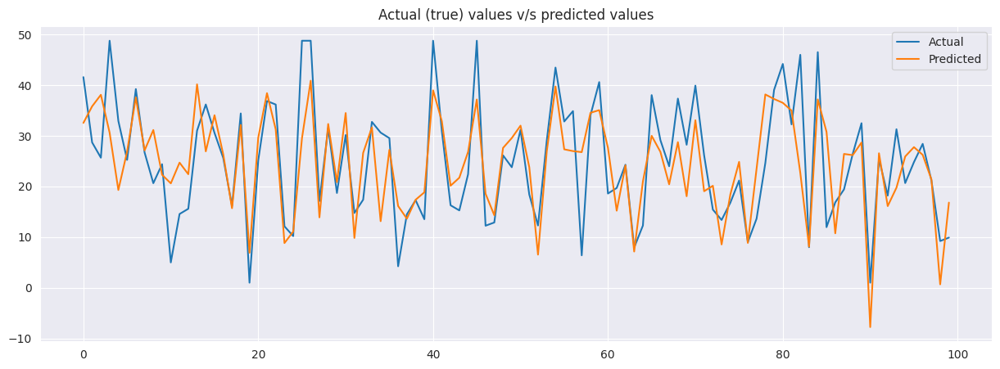

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
plt.plot(y_test[0:100])
plt.plot(y_test_pred[0:100])
plt.title('Actual (true) values v/s predicted values')
plt.legend(["Actual", "Predicted"])
plt.show()

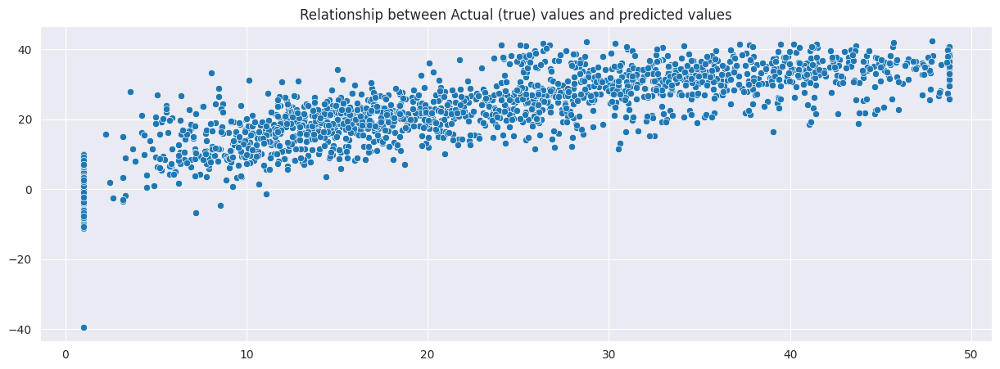

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
sns.scatterplot(x=y_test, y=y_test_pred)
plt.title('Relationship between Actual (true) values and predicted values')
plt.show()

1. The Ridge (L2) regression model gave the same performance as the above linear and lasso regression models.
2. The relationship between actual and predicted values suggests that the model has been slightly improved.
3. The model provided only 62% of the performance score, and the mean of the residual was not close to zero, indicating that the model was not well trained to make predictions.


### **Decision Tree**

train_test_split

In [ ]:
# Fitting Decision tree Regression model to training set
from sklearn.tree import DecisionTreeRegressor
dtree=DecisionTreeRegressor(criterion='squared_error',max_leaf_nodes=10, random_state=0)
dtree.fit(X_train, y_train)

DecisionTreeRegressor(max_leaf_nodes=10, random_state=0)

In [ ]:
# Score of the model
dtree_score = dtree.score(X_train, y_train)
print(f'Score of the model : {dtree_score}')

Score of the model : 0.7217408060761781


In [ ]:
# Predicting results for train and test set
y_train_pred = dtree.predict(X_train)
y_test_pred = dtree.predict(X_test)

In [ ]:
# Evaluating model
print(f'Training set evaluation result\n____________________________________')
evaluate_model(y_train, y_train_pred)
print(f'Test set evaluation result\n____________________________________')
evaluate_model(y_test, y_test_pred)

Training set evaluation result
____________________________________
Mean squared error (MSE): 41.798025171362255
Root mean squared error (RMSE): 6.465139222890893
Mean absolute error (MAE): 4.880238891112916
R2 Square 0.7217408060761781
____________________________________
Test set evaluation result
____________________________________
Mean squared error (MSE): 42.74620140910454
Root mean squared error (RMSE): 6.538057923351899
Mean absolute error (MAE): 4.916573458097293
R2 Square 0.7128927455592566
____________________________________


In [ ]:
# Evaluate on the test set

train_adjusted_r2 = calculate_adjusted_r2(y_train, y_train_pred, X_train.shape[1])
print('Train set evaluation result\n____________________________________')
print('Adjusted R2:', train_adjusted_r2)
print('____________________________________')

# Evaluate on the test set

test_adjusted_r2 = calculate_adjusted_r2(y_test, y_test_pred, X_test.shape[1])
print('Test set evaluation result\n____________________________________')
print('Adjusted R2:', test_adjusted_r2)
print('____________________________________')

Train set evaluation result
____________________________________
Adjusted R2: 0.7212634493460729
____________________________________
Test set evaluation result
____________________________________
Adjusted R2: 0.7109115569144671
____________________________________


In [ ]:
# Finding mean of Residuals
print(f'Mean of Residuals for test set\n____________________________________')
residuals = y_test - y_test_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals for test set
____________________________________
Mean of Residuals 0.24736901866191427


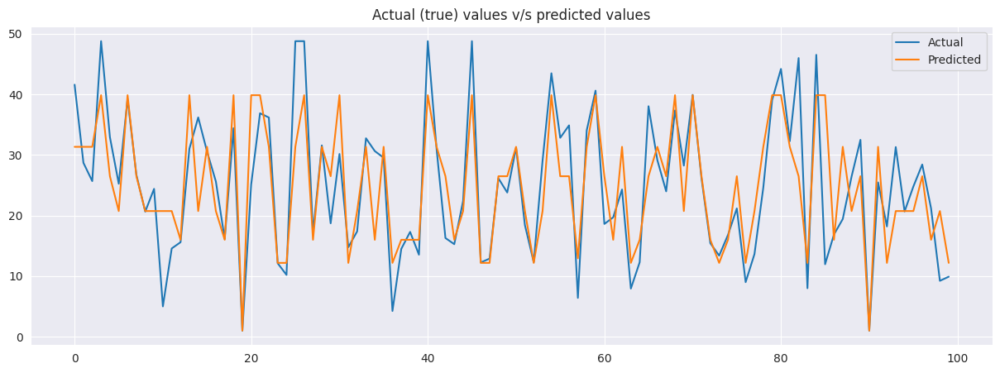

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
plt.plot(y_test[0:100])
plt.plot(y_test_pred[0:100])
plt.title('Actual (true) values v/s predicted values')
plt.legend(["Actual", "Predicted"])
plt.show()

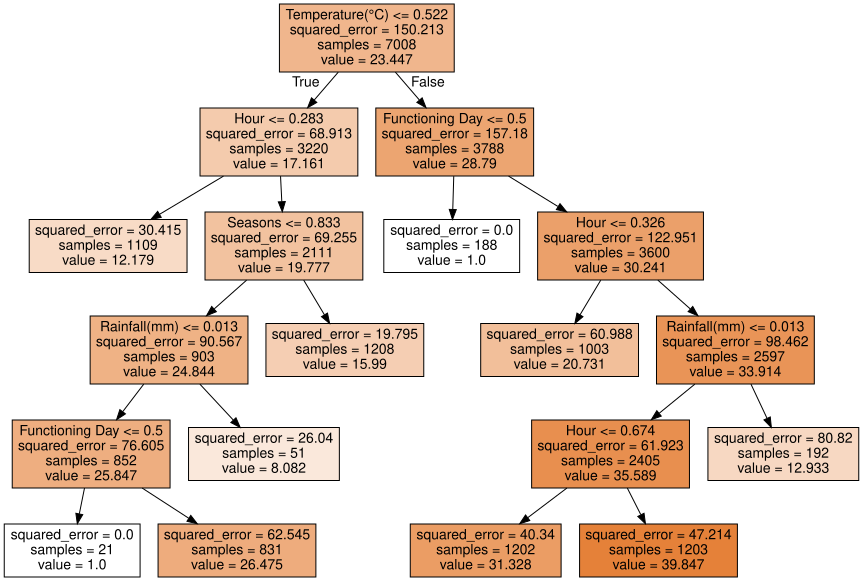

In [ ]:
# Visulaizing Decision Tree

# Importing libraries
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn import tree
from IPython.display import SVG
from graphviz import Source
from IPython.display import display

# Visualizing graph
graph = Source(tree.export_graphviz(dtree, out_file=None
   , feature_names=bike_df[independent_variables].columns
   , filled = True))
display(SVG(graph.pipe(format='svg')))

Model Decision Tree using train test split performs well based on the above model score and graph.

Cross Validation

In [ ]:
# Fitting Decision tree regression model to training set
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor(random_state=0)
param_dict = {'max_depth':[4,6,8],
              'min_samples_split':[50,100,150],
              'min_samples_leaf':[40,50]}
dtree_reg = GridSearchCV(dtree, param_dict, verbose=1, scoring='neg_mean_squared_error', cv=5)
dtree_reg.fit(X_train, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=0),
             param_grid={'max_depth': [4, 6, 8], 'min_samples_leaf': [40, 50],
                         'min_samples_split': [50, 100, 150]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
# Best estimators
dtree_reg_best_est=dtree_reg.best_estimator_
print(f'The best estimator values : {dtree_reg_best_est}')

The best estimator values : DecisionTreeRegressor(max_depth=8, min_samples_leaf=40, min_samples_split=50,
                      random_state=0)


In [ ]:
# best fit values
dtree_reg_best_params=dtree_reg.best_params_
print(f'The best fit values: {dtree_reg_best_params}')

The best fit values: {'max_depth': 8, 'min_samples_leaf': 40, 'min_samples_split': 50}


In [ ]:
# Mean cross-validated score of the best_estimator of model
dtree_reg_score=dtree_reg.best_score_
print(f" The negative mean squared error is: {dtree_reg_score}")

 The negative mean squared error is: -32.76097945522946


In [ ]:
# Predicting results for train and test set
y_train_pred =dtree_reg.predict(X_train)
y_test_pred =dtree_reg.predict(X_test)

In [ ]:
# Evaluating model
print(f'Training set evaluation result\n____________________________________')
evaluate_model(y_train, y_train_pred)
print(f'Test set evaluation result\n____________________________________')
evaluate_model(y_test, y_test_pred)

Training set evaluation result
____________________________________
Mean squared error (MSE): 26.080840871041286
Root mean squared error (RMSE): 5.106940460886664
Mean absolute error (MAE): 3.5600229698561345
R2 Square 0.8263737646006375
____________________________________
Test set evaluation result
____________________________________
Mean squared error (MSE): 31.479085070816268
Root mean squared error (RMSE): 5.610622520791812
Mean absolute error (MAE): 3.855997227369922
R2 Square 0.7885689631111018
____________________________________


In [ ]:
# Evaluate on the test set

train_adjusted_r2 = calculate_adjusted_r2(y_train, y_train_pred, X_train.shape[1])
print('Train set evaluation result\n____________________________________')
print('Adjusted R2:', train_adjusted_r2)
print('____________________________________')

# Evaluate on the test set

test_adjusted_r2 = calculate_adjusted_r2(y_test, y_test_pred, X_test.shape[1])
print('Test set evaluation result\n____________________________________')
print('Adjusted R2:', test_adjusted_r2)
print('____________________________________')

Train set evaluation result
____________________________________
Adjusted R2: 0.8260759068701454
____________________________________
Test set evaluation result
____________________________________
Adjusted R2: 0.7871099795328
____________________________________


In [ ]:
# Finding mean of Residuals
print(f'Mean of Residuals for test set\n____________________________________')
residuals = y_test-y_test_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals for test set
____________________________________
Mean of Residuals 0.20737793020928458


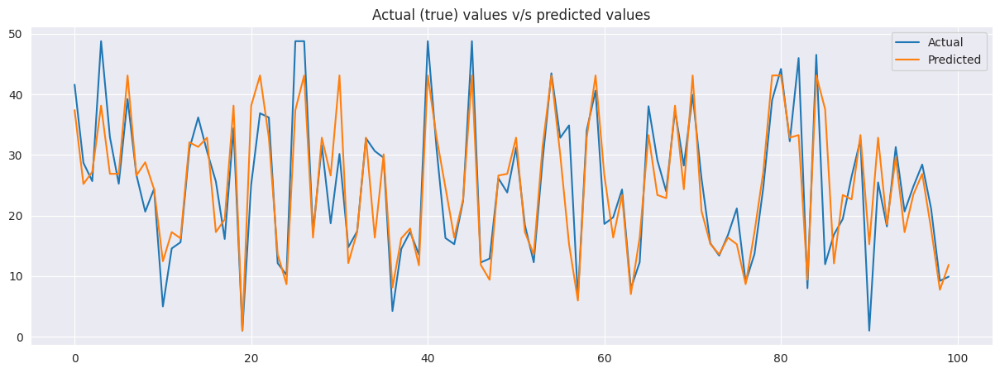

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
plt.plot(y_test[0:100])
plt.plot(y_test_pred[0:100])
plt.title('Actual (true) values v/s predicted values')
plt.legend(["Actual", "Predicted"])
plt.show()

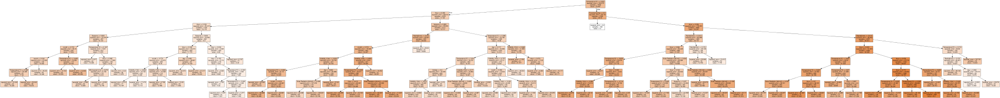

In [ ]:
# Visulaizing Decision Tree

# Importing libraries
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn import tree
from IPython.display import SVG
from graphviz import Source
from IPython.display import display

# Visualizing graph
graph = Source(tree.export_graphviz(dtree_reg.best_estimator_, out_file=None
   , feature_names= bike_df[independent_variables].columns
   , filled = True))
display(SVG(graph.pipe(format='svg')))

1. The decision tree regression model is well trained than other Linear regression, Lasso, Ridge, and ElasticNet regression models.
2. Cross validation and hyperparameter tuning improved the decision tree model's performance and reduced error more than train_test_split.
3. A model decision tree using GridSearchCV performs well based on the above model score and graph.

**Random Forest**

train_test_split

In [ ]:
# Fitting Random Forest Regression model to training set
from sklearn.ensemble import RandomForestRegressor
rf_tts=RandomForestRegressor(criterion='squared_error',max_leaf_nodes=10, random_state=0)
rf_tts.fit(X_train, y_train)

RandomForestRegressor(max_leaf_nodes=10, random_state=0)

In [ ]:
# Score of the model
rf_tts_score=rf_tts.score(X_train, y_train)
print(f'Score of the model : {rf_tts_score}')

Score of the model : 0.7537562647066289


In [ ]:
# Predicting results for train and test set
y_train_pred_tts=rf_tts.predict(X_train)
y_test_pred_tts=rf_tts.predict(X_test)

In [ ]:
# Evaluating model
print(f'Training set evaluation result\n____________________________________')
evaluate_model(y_train, y_train_pred_tts)
print(f'Test set evaluation result\n____________________________________')
evaluate_model(y_test, y_test_pred_tts)

Training set evaluation result
____________________________________
Mean squared error (MSE): 36.988901250466235
Root mean squared error (RMSE): 6.081850150280442
Mean absolute error (MAE): 4.654473147039143
R2 Square 0.7537562647066289
____________________________________
Test set evaluation result
____________________________________
Mean squared error (MSE): 38.16115283895533
Root mean squared error (RMSE): 6.177471395235702
Mean absolute error (MAE): 4.740794064936302
R2 Square 0.7436884809242383
____________________________________


In [ ]:
# Evaluate on the test set

train_adjusted_r2 = calculate_adjusted_r2(y_train, y_train_pred_tts, X_train.shape[1])
print('Train set evaluation result\n____________________________________')
print('Adjusted R2:', train_adjusted_r2)
print('____________________________________')

# Evaluate on the test set

test_adjusted_r2 = calculate_adjusted_r2(y_test, y_test_pred_tts, X_test.shape[1])
print('Test set evaluation result\n____________________________________')
print('Adjusted R2:', test_adjusted_r2)
print('____________________________________')

Train set evaluation result
____________________________________
Adjusted R2: 0.7533338308505145
____________________________________
Test set evaluation result
____________________________________
Adjusted R2: 0.7419197987914556
____________________________________


In [ ]:
# Finding mean of Residuals
print(f'Mean of Residuals for test set\n____________________________________')
residuals = y_test-y_test_pred_tts
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals for test set
____________________________________
Mean of Residuals 0.2471781618771489


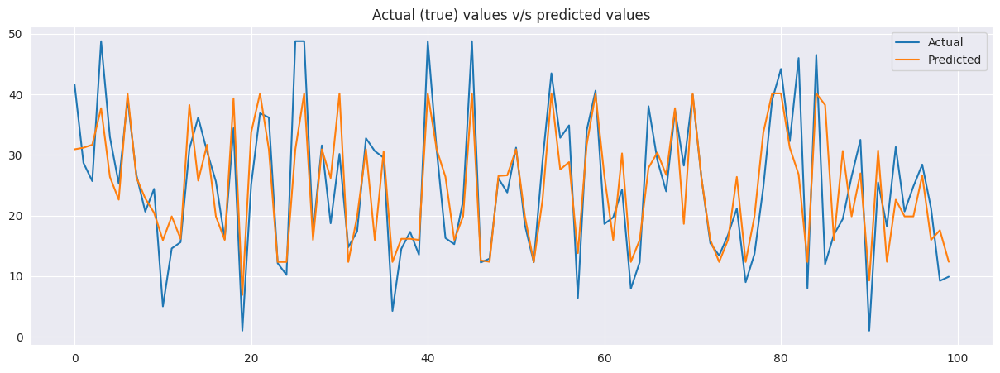

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
plt.plot(y_test[0:100])
plt.plot(y_test_pred_tts[0:100])
plt.title('Actual (true) values v/s predicted values')
plt.legend(["Actual", "Predicted"])
plt.show()

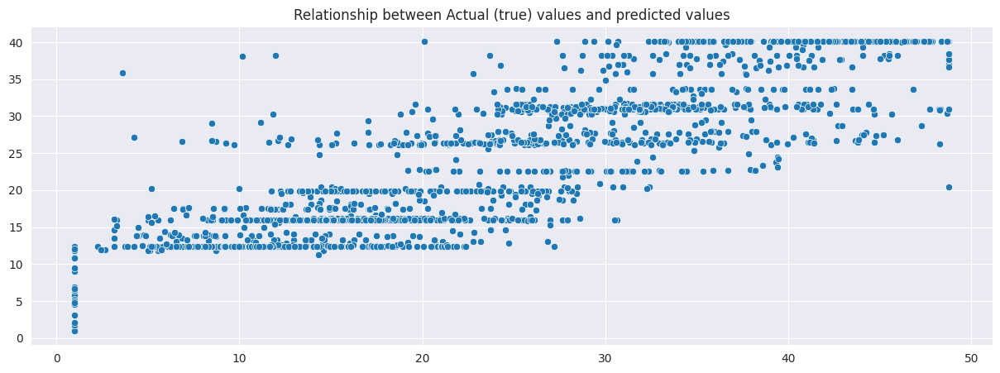

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
sns.scatterplot(x=y_test, y=y_test_pred_tts)
plt.title('Relationship between Actual (true) values and predicted values')
plt.show()

Using train_test_split, we achieved the highest model accuracy compared to the all above models.

**Cross Validation**

In [ ]:
# Fitting Random Forest regression model to training set
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

rf_cv = RandomForestRegressor(random_state=42)
param_dict = {
    'n_estimators': [50, 80, 100],
    'max_depth': [4, 6, 8],
    'min_samples_split': [50, 100, 150],
    'min_samples_leaf': [40, 50]}

rf_reg = RandomizedSearchCV(rf_cv, param_dict, n_iter=10, random_state=42, verbose=1, scoring='neg_mean_squared_error', cv=5)
rf_reg.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   param_distributions={'max_depth': [4, 6, 8],
                                        'min_samples_leaf': [40, 50],
                                        'min_samples_split': [50, 100, 150],
                                        'n_estimators': [50, 80, 100]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=1)

In [ ]:
# Best estimators
rf_reg_best_est=rf_reg.best_estimator_
print(f'The best estimator values : {rf_reg_best_est}')

The best estimator values : RandomForestRegressor(max_depth=8, min_samples_leaf=40, min_samples_split=150,
                      random_state=42)


In [ ]:
# best fit values
rf_reg_best_params=rf_reg.best_params_
print(f'The best fit values: {rf_reg_best_params}')

The best fit values: {'n_estimators': 100, 'min_samples_split': 150, 'min_samples_leaf': 40, 'max_depth': 8}


In [ ]:
# Mean cross-validated score of the best_estimator of model
rf_reg_score=rf_reg.best_score_
print(f" The negative mean squared error is: {rf_reg_score}")

 The negative mean squared error is: -27.66981021701402


In [ ]:
# Predicting results for train and test set
y_train_pred=rf_reg.predict(X_train)
y_test_pred=rf_reg.predict(X_test)

In [ ]:
# Evaluating model
print(f'Training set evaluation result\n____________________________________')
evaluate_model(y_train, y_train_pred)
print(f'Test set evaluation result\n____________________________________')
evaluate_model(y_test, y_test_pred)

Training set evaluation result
____________________________________
Mean squared error (MSE): 24.887493328691246
Root mean squared error (RMSE): 4.9887366465560445
Mean absolute error (MAE): 3.5689348294682963
R2 Square 0.8343181572805292
____________________________________
Test set evaluation result
____________________________________
Mean squared error (MSE): 27.05936915633682
Root mean squared error (RMSE): 5.201862085478316
Mean absolute error (MAE): 3.7144111386688077
R2 Square 0.8182542324399452
____________________________________


In [ ]:
# Evaluate on the test set

train_adjusted_r2 = calculate_adjusted_r2(y_train, y_train_pred, X_train.shape[1])
print('Train set evaluation result\n____________________________________')
print('Adjusted R2:', train_adjusted_r2)
print('____________________________________')

# Evaluate on the test set

test_adjusted_r2 = calculate_adjusted_r2(y_test, y_test_pred, X_test.shape[1])
print('Test set evaluation result\n____________________________________')
print('Adjusted R2:', test_adjusted_r2)
print('____________________________________')

Train set evaluation result
____________________________________
Adjusted R2: 0.834033928243698
____________________________________
Test set evaluation result
____________________________________
Adjusted R2: 0.8170000925832915
____________________________________


In [ ]:
# Finding mean of Residuals
print(f'Mean of Residuals for test set\n____________________________________')
residuals = y_test-y_test_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals for test set
____________________________________
Mean of Residuals 0.2014203112966648


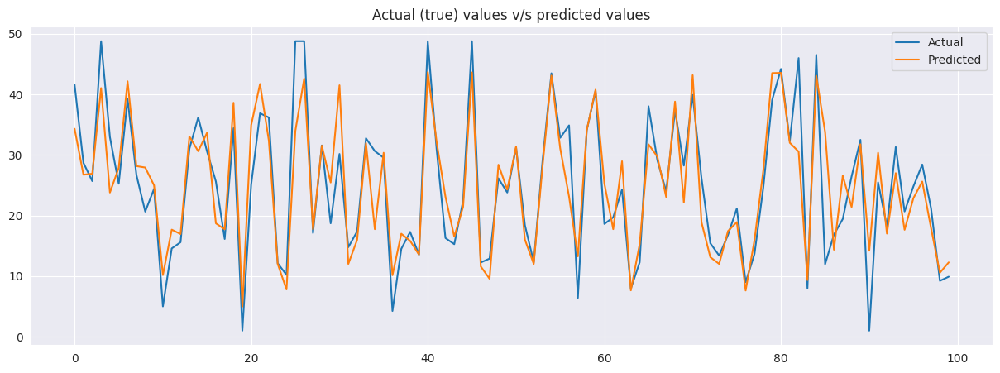

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
plt.plot(y_test[0:100])
plt.plot(y_test_pred[0:100])
plt.title('Actual (true) values v/s predicted values')
plt.legend(["Actual", "Predicted"])
plt.show()

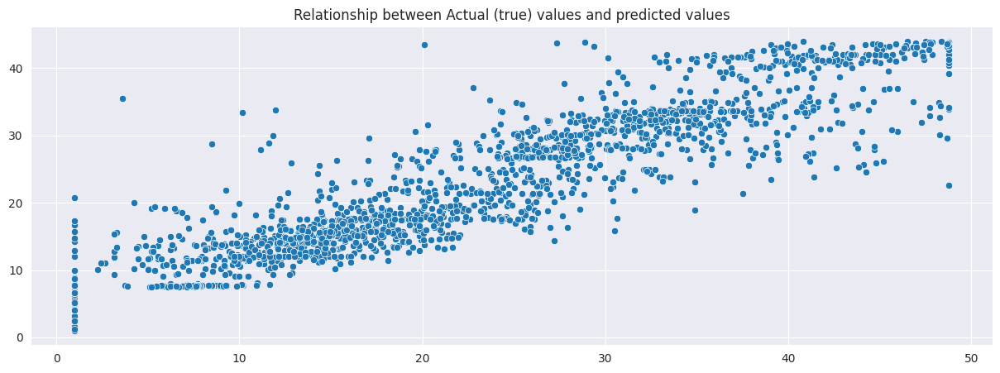

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
sns.scatterplot(x=y_test, y=y_test_pred)
plt.title('Relationship between Actual (true) values and predicted values')
plt.show()

1. The Random Forest regression model is well trained than other Linear regression, Lasso, Ridge, ElasticNet, and Decision tree regression models.
2. Cross validation and hyperparameter tuning improved the Random Forest regression model's performance and reduced error more than train_test_split.
3. A model Random Forest regression using GridSearchCV performs well based on the above model score and graph.

### XGBoost

**Cross Validation**

In [ ]:
# Fitting XGBoost regression model to training set
import xgboost as xgb
xgb_cv = xgb.XGBRegressor(random_state=0)

param_dict = {'n_estimators':[50,80,100],
              'max_depth':[4,6,8],
              'min_samples_split':[50,100,150],
              'min_samples_leaf':[40,50]}
xgb_reg = GridSearchCV(xgb_cv, param_dict, verbose=1, scoring='neg_mean_squared_error', cv=3)
xgb_reg.fit(X_train, y_train)

Fitting 3 folds for each of 54 candidates, totalling 162 fits
[12:10:33] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[12:10:34] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[12:10:36] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[12:10:37] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[12:10:39] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[12:10:43] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[12:10:47] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[12:10:49] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[12:10:53] WARNING

GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=0, ...),
             param_grid={'max_depth': [4, 6, 8], 'min_samples_leaf': [40, 50],
                         'min_samples_split': [50, 100, 150],
                         'n_estimators': [50, 80, 100]},
             scoring='neg_mean_squared_error', verbose=1)

In [ ]:
# Best estimators
xgb_reg_best_est=xgb_reg.best_estimator_
print(f'The best estimator values : {xgb_reg_best_est}')


The best estimator values : XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, min_samples_leaf=40, min_samples_split=50,
             missing=nan, monotone_constraints=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, ...)


In [ ]:
# best fit values
xgb_reg_best_params=xgb_reg.best_params_
print(f'The best fit values: {xgb_reg_best_params}')

The best fit values: {'max_depth': 6, 'min_samples_leaf': 40, 'min_samples_split': 50, 'n_estimators': 100}


In [ ]:
# Mean cross-validated score of the best_estimator of model
xgb_reg_score=xgb_reg.best_score_
print(f" The negative mean squared error is: {xgb_reg_score}")

 The negative mean squared error is: -16.441106020894622


In [ ]:
# Predicting results for train and test set
y_train_pred = xgb_reg.predict(X_train)
y_test_pred = xgb_reg.predict(X_test)

In [ ]:
# Evaluating model
print(f'Training set evaluation result\n____________________________________')
evaluate_model(y_train, y_train_pred)
print(f'Test set evaluation result\n____________________________________')
evaluate_model(y_test, y_test_pred)

Training set evaluation result
____________________________________
Mean squared error (MSE): 3.6136906983409802
Root mean squared error (RMSE): 1.9009709882954502
Mean absolute error (MAE): 1.309914356532506
R2 Square 0.9759428189085996
____________________________________
Test set evaluation result
____________________________________
Mean squared error (MSE): 14.958419539705803
Root mean squared error (RMSE): 3.867611606625697
Mean absolute error (MAE): 2.547855090886671
R2 Square 0.8995309378787755
____________________________________


In [ ]:
# Evaluate on the test set

train_adjusted_r2 = calculate_adjusted_r2(y_train, y_train_pred, X_train.shape[1])
print('Train set evaluation result\n____________________________________')
print('Adjusted R2:', train_adjusted_r2)
print('____________________________________')

# Evaluate on the test set

test_adjusted_r2 = calculate_adjusted_r2(y_test, y_test_pred, X_test.shape[1])
print('Test set evaluation result\n____________________________________')
print('Adjusted R2:', test_adjusted_r2)
print('____________________________________')

Train set evaluation result
____________________________________
Adjusted R2: 0.9759015485478996
____________________________________
Test set evaluation result
____________________________________
Adjusted R2: 0.8988376493534996
____________________________________


In [ ]:
# Finding mean of Residuals
print(f'Mean of Residuals for test set\n____________________________________')
residuals = y_test - y_test_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals for test set
____________________________________
Mean of Residuals 0.06473874965996729


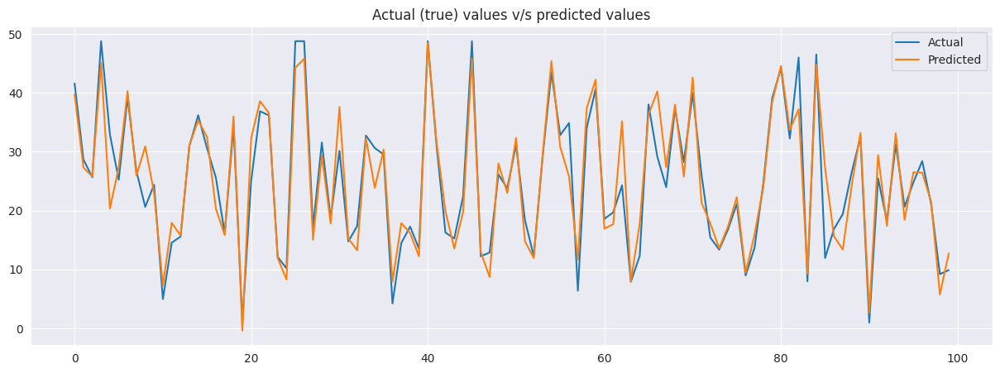

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
plt.plot(y_test[0:100])
plt.plot(y_test_pred[0:100])
plt.title('Actual (true) values v/s predicted values')
plt.legend(["Actual", "Predicted"])
plt.show()

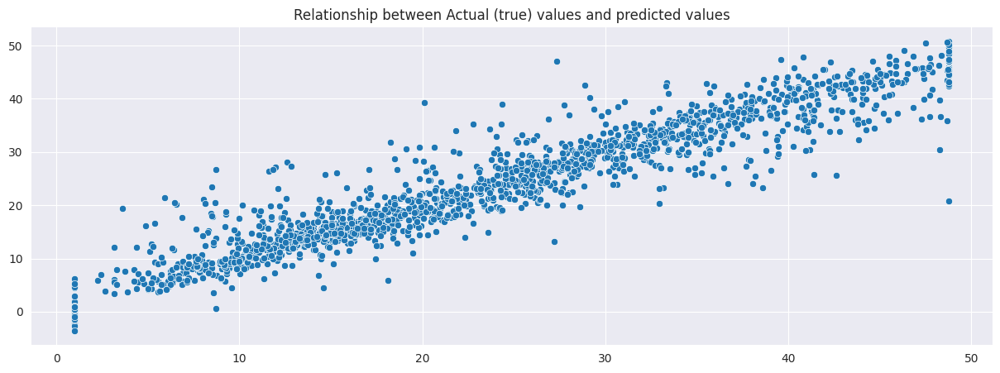

In [ ]:
# Plotting graph of Actual (true) values and predicted values
plt.figure(figsize=(15,5))
sns.scatterplot(x=y_test, y=y_test_pred)
plt.title('Relationship between Actual (true) values and predicted values')
plt.show()

1. We got the highest model performance accuracy and lowest mean of residuals using XGBoost compared to all the above Linear regression, Lasso, Ridge, ElasticNet, and Decision tree regression models.
2. Cross validation and hyperparameter tuning improved the Random Forest regression model's performance and reduced error more than train_test_split.
3. A model XGBoost regression using GridSearchCV performs well based on the above model score and graph.
4. Mean of residuals are very very close to zero, means model well fitted and trained.

## **Comparing Different Models based on the Evaluation Metrics**

In [ ]:
# import module
from tabulate import tabulate

# Assign data
mydata = [
    ['Linear regression',"56.11071", "7.49070", '5.79057','0.623129','0.6205286','0.184718'],
    ['Lasso (L1)',"56.1015", "7.490094", '5.7906075','0.62319105','0.62059087','0.184956'],
    ['Ridge (L2)',"56.108121", "7.4905354", '5.791172','0.623146','0.6205401','0.184706'],
    ['Decision Tree','31.4790',"5.61062", '3.8559','0.788568','0.787109','0.207377'],
    ['Random Forest',"26.070", "5.1034", '3.6223','0.8248','0.8237','0.2243'],
    ['XGBoost',"14.19", "3.80", '2.43','0.9026','0.9007','0.1463']
]

# Create header for table
head = ['ML Model Name',"MSE", "RMSE", 'MAE','R-squared','Ad. R-squared','Mean of Residuals']

# display table
print(tabulate(mydata, headers=head, tablefmt="grid"))
print('Note : Highest evaluation metric are taken into consideration between train_test_split and cross validation from each model')

+-------------------+---------+---------+---------+-------------+-----------------+---------------------+
| ML Model Name     |     MSE |    RMSE |     MAE |   R-squared |   Ad. R-squared |   Mean of Residuals |
+===================+=========+=========+=========+=============+=================+=====================+
| Linear regression | 56.1107 | 7.4907  | 5.79057 |    0.623129 |        0.620529 |            0.184718 |
+-------------------+---------+---------+---------+-------------+-----------------+---------------------+
| Lasso (L1)        | 56.1015 | 7.49009 | 5.79061 |    0.623191 |        0.620591 |            0.184956 |
+-------------------+---------+---------+---------+-------------+-----------------+---------------------+
| Ridge (L2)        | 56.1081 | 7.49054 | 5.79117 |    0.623146 |        0.62054  |            0.184706 |
+-------------------+---------+---------+---------+-------------+-----------------+---------------------+
| Decision Tree     | 31.479  | 5.61062 | 3.85

In [ ]:
# Creating Dataframe of required data
evaluation_df=pd.DataFrame({'Model':['Linear regression','Lasso (L1)','Ridge (L2)','Decision Tree','Random Forest','XGBoost'],
                      'R_squared':[0.623129,0.623191,0.623146,0.788568,0.8251,0.9026],
                       'RMSE':[7.4907,7.49009,7.49054,5.61062,5.1034,3.80],
                       'Mean of Residuals':[0.184718,0.184956,0.184706,0.207377,0.22154,0.1463]})
# Dataset
evaluation_df

,Model,R_squared,RMSE,Mean of Residuals
0,Linear regression,0.623129,7.49070,0.184718
1,Lasso (L1),0.623191,7.49009,0.184956
2,Ridge (L2),0.623146,7.49054,0.184706
3,Decision Tree,0.788568,5.61062,0.207377
4,Random Forest,0.825100,5.10340,0.221540
5,XGBoost,0.902600,3.80000,0.146300


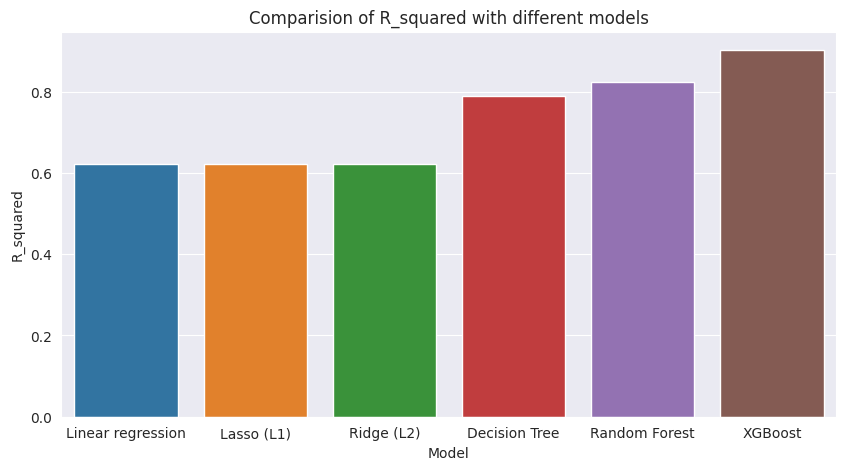

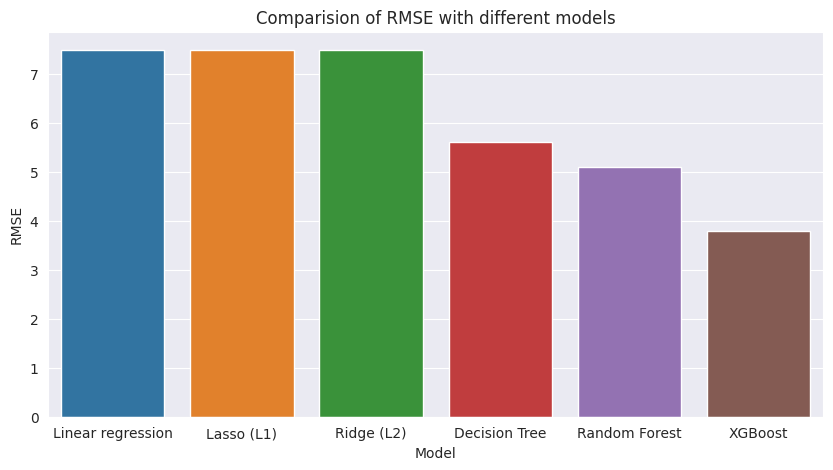

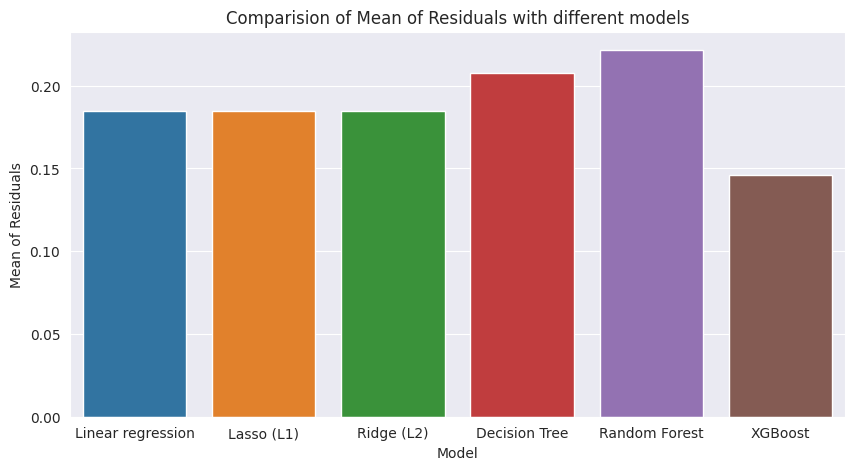

In [ ]:
# Plotting bar plot to compare score and error of each model
for var in ['R_squared','RMSE','Mean of Residuals']:
    plt.figure(figsize=(10,5))
    ax=sns.barplot(x=evaluation_df['Model'],y=evaluation_df[var])
    ax.set_title(f'Comparision of {var} with different models')
    plt.show()

1. The XGBoost regression model has the highest R-squared score, the lowest Root Mean Squared Error (RMSE), and has very close to having zero mean of residuals.
2. Therefore, the XGBoost regression model is the ideal model and well-trained for forecasting the number of rented bikes required per hour based on the model's high accuracy, low error, and zero mean of residuals.

## **Model Explainability**

### Feature Importance

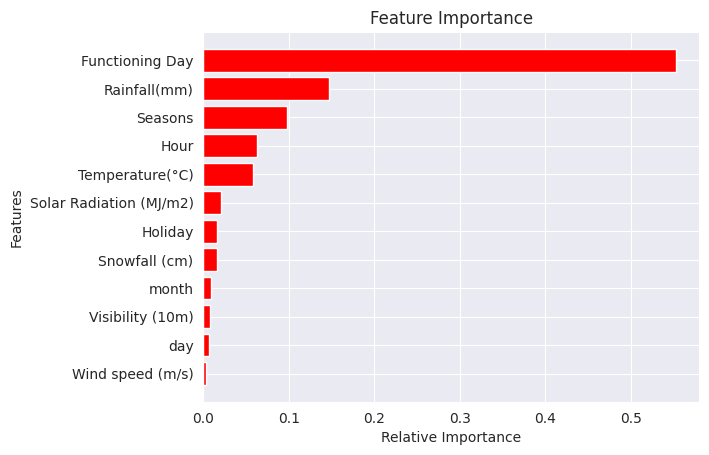

In [ ]:
 # Feature Importance for XGBoost regression model

# Create instance for independant features names
features = bike_df[independent_variables].columns
# Creating object of feature importance
importances = xgb_reg.best_estimator_.feature_importances_
indices = np.argsort(importances)

# Plot the graph for important feature
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.ylabel('Features')
plt.show()

A higher feature importance score for features : Functioning Days, Rainfall (mm), and Seasons, respectively, indicates that those specific features have a larger influence on the model used to forecast a certain variable, respectively.

## Conclusion

The following observations were made after importing and analyzing the data :
1. Customers favour rental motorcycles equally in all seasons.
2. When there are no holidays, customers choose to rent motorcycles. Customers hardly ever use the bikes they rent while traveling on holiday.
3. Nearly all consumers preferred to rent bikes during functional hours.
4. Bicycle rentals are popular all month long.
5.Renting bicycles was not very popular in 2017, but it increased by 83.02 percent in 2018.
6.At night, customers do not prefer to use rented bikes.
7.Customers do not prefer rented bikes in the mornings 4 and 5, but from 7, 8, and 9, the use of rented bikes increases, possibly due to working people going to the office, and it is the same in the evenings 5, 6, and 7, because people are travelling from the office to home. Overall, the rented bike was the most frequently used during office in and out times.
8.Customers mostly use rented bikes for transportation in the evening.
9.Customers who travel most commonly use rented bikes in the morning at 8 a.m. and in the evening at 6 p.m.
10.When the humidity level is between 10% and 18%, people prefer to rent bikes.
11.wind speed is between 2 m/s and 3.5 m/s, people consistently use rented bikes, and it is at its peak when wind speed is normal, which is 3.2 m/s.
12.Renting a bike is the best option for customers in dew point temperatures ranging from 12°C to 18°C. The use of a rented bike increases with increasing dew point temperatures, but it still reaches normal dew point temperatures.
13.According to the graph, solar radiation has no effect on customer use of rented bikes.
14.When it's not raining, people prefer rental bikes the most.
15.When there is no snowfall, most people opt to rent bikes. However, the majority of customers prefer to rent bikes when it snows up to 4 cm.
16.In the first 10 days of the month, most rented bikes are used by customers. Customers consistently use rented bikes in the last 15 days of the month.
17.In June, most rented bikes are used through the year, followed by October. Customers' use of rent bikes is at its peak from April to September.
18.The count of rented bikes on that day is unaffected by the day's visibility, but when visibility exceeds 1750, use of rented bikes increases more than usual.
19.During the summer and autumn seasons, most people rent bikes. During the winter, fewer people choose to rent bikes.
20.Even when there is no holiday other than a holiday, people rent bikes. The use of rented bikes on holidays is lower than on non-holiday days.
21.Almost every rented bike is used during its functional hours.
22.The use of rented bikes increased by three times in 2018 compared to 2017.

The XGBoost regression model has the highest R-squared score, the lowest Root Mean Squared Error (RMSE), and has very close to having zero mean of residuals.

As a result of the model's high accuracy, low error, and zero mean of residuals, the XGBoost regression model is the ideal and well-trained model for forecasting the number of rented bikes required per hour.

## **Project Summary**



This Seoul Bike Sharing Demand Prediction machine learning project aims to predict demand for bike-sharing based on historical data. The dataset used contains data from a bike-sharing system including the date, hour, weather conditions, temperature, and the number of bikes rented.

The aim of the project is to use this data to build a predictive model that can accurately estimate bike rental demand for any given hour. The model will be evaluated on its accuracy in predicting the number of bikes rented during a given hour.

The data set included Rental bike information. As part of the analysis, descriptive statistics were calculated for each variable, and visualizations were created to explore the relationships between various variables. To get insight from the dataset, we built a variety of charts, including a distplot, count plot, bar plot, line plot, heatmap, and boxplot.

Dataset for rented bikes with 8760 observations and 14 variables. These include Date, Rented Bike Count, Hour, Temperature (°C), Humidity (%), Wind speed (m/s, Visibility (10m), Dew point temperature, Solar Radiation, Rainfall (mm), Snowfall (cm), Seasons, Holiday, and Functioning Day. The parse_date() method was used to transform the feature date from its original object form to datetime64.

There are no duplicate values in the dataset. Additionally, there are no null or missing values in the dataset. 3 variables in the dataset Seasons, Holidays, and Functional Day are categorical variables, however, the remaining 11 variables are all of a numerical character. The Outliers found for Rented Bike Count, Wind speed (m/s), Solar Radiation (MJ/m2), Rainfall (mm), and Snowfall (cm). It is advisable to omit the columns labeled "Rainfall (mm)" and "Snowfall (cm)" because of their flat interquartile ranges. We eliminated outliers from Rented Bike Count, Wind speed (m/s), and Solar Radiation (MJ/m2) by using the interquartile range.

We delete the original Date variable from the dataset and replace it with new variables that include the day, month, and year that we extracted from the Date variable. The dataset is now prepared for analysis.

After doing univariate, bivariate, and multivariate analyses, we discovered insights which are following :

* Customers favor rental motorcycles equally in all seasons.
* When there are no holidays, customers choose to rent motorcycles. Customers hardly ever use the bikes they rent while traveling on holiday.
* Nearly all consumers preferred to rent bikes during functional hours.
* Bicycle rentals are popular all month long.
* Renting bicycles was not very popular in 2017, but it increased by 83.02 percent in 2018.
* At night, customers do not prefer to use rented bikes.
* Customers do not prefer rented bikes in the mornings 4 and 5, but from 7, 8, and 9, the use of rented bikes increases, possibly due to working people going to the office, and it is the same in the evenings 5, 6, and 7, because people are travelling from the office to home. Overall, the rented bike was the most frequently used during office in and out times.
* Customers mostly use rented bikes for transportation in the evening.
* Customers who travel most commonly use rented bikes in the morning at 8 a.m. and in the evening at 6 p.m.
* When the humidity level is between 10% and 18%, people prefer to rent bikes.
wind speed is between 2 m/s and 3.5 m/s, people consistently use rented bikes, and it is at its peak when wind speed is normal, which is 3.2 m/s.
* Renting a bike is the best option for customers in dew point temperatures ranging from 12°C to 18°C. The use of a rented bike increases with increasing dew point temperatures, but it still reaches normal dew point temperatures.
* According to the graph, solar radiation has no effect on customer use of rented bikes.
*When it's not raining, people prefer rental bikes the most.
* When there is no snowfall, most people opt to rent bikes. However, the majority of customers prefer to rent bikes when it snows up to 4 cm.
* In the first 10 days of the month, most rented bikes are used by customers. Customers consistently use rented bikes in the last 15 days of the month.
* In June, most rented bikes are used through the year, followed by October. Customers' use of rent bikes is at its peak from April to September.
* The count of rented bikes on that day is unaffected by the day's visibility, but when visibility exceeds 1750, use of rented bikes increases more than usual.
* During the summer and autumn seasons, most people rent bikes. During the winter, fewer people choose to rent bikes.
* Even when there is no holiday other than a holiday, people rent bikes. The use of rented bikes on holidays is lower than on non-holiday days.
* Almost every rented bike is used during its functional hours.
* The use of rented bikes increased by three times in 2018 compared to 2017.

We also verified the presumptions of the regression machine learning model. We restore the distribution of the features Rented Bike Count, Wind speed (m/s), Solar Radiation (MJ/m2), Visibility (10 m), Rainfall (mm), and Snowfall (cm) to normal using log and square root transformation. We also check to see if there is a linear relationship between the independent and dependent variables.

Furthermore, we use a heatmap and the variance inflation factor to examine multicollinearity in independent variables (VIF). Due to their high VIFs, we eliminated the variables year, dew point temperature (°C), and humidity (%). Once categorical variables like seasons, holidays, and working days were encoded, our dataset was ready to be used with a machine-learning model.

To make it easier for a model to learn and understand the problem, we divided the dataset into dependent and independent features and scaled them to the same length. Then we implement machine learning models like linear regression, Lasso (L1), Ridge (L2), ElasticNet, Decision Tree regressors, Random Forest, and XGBoost regression. We obtained a high accuracy of 0.9026 and a low root mean squared error of 3.80 from the XGBoost model, become final optimal model for prediction.

The Functioning Days, Rainfall (mm), and Seasons variables have a significant influence on the XBoost model, according to our plot of feature significance. Additionally, we explain our XGBoost model using SHAP.

Some difficulties faced during the implementation of the model include data accuracy and data integration. Additionally, the model may require extensive tuning and testing to ensure the accuracy and reliability of the predictions. Lastly, the model may need to be regularly updated in order to keep up with changes in the environment or bike-rental patterns.

